# Big Data Analytics Project - Airbnb Pricing Prediction <br>

### Group 63 <br>
André Lourenço - 20240743 <br>
Fábio Dos Santos - 20240678 <br>
Rafael Borges - 20240497 <br>
Rui Reis - 20240854 <br>
Victor Silva - 20240663 

## Table of Contents
- [1. Import Libraries](#1-import-libraries)
- [2. Data Integration](#2-data-integration)
  - [2.1 Data Description](#21-data-description)
- [3. Data Content](#3-data-content)
- [4. Missing Values](#4-missing-values)
- [5. Descriptive Statistics and Feature Exploration](#5-descriptive-statistics-and-feature-exploration)
  - [5.1. Number of New Hosts per Year](#51-number-of-new-hosts-per-year)
  - [5.2. Number Superhosts vs Non-SuperHosts](#52-number-superhosts-vs-non-superhosts)
  - [5.3. Host Responses Analysis](#53-host-response-analysis)
  - [5.4. Years Host are Active](#54-years-host-are-active)
  - [5.5. Hosts Characterization](#55-hosts-characterization)
  - [5.6. Property and Room type](#56-property-and-room-type)
  - [5.7. Accomodates](#57-accomodates)
  - [5.8. Bedrooms](#58-bedrooms)
  - [5.9. Amenities](#59-amenities)
  - [5.10. Price](#510-price)
  - [5.11. Reviews](#511-reviews)
  - [5.12. Instant Bookable](#512-instant-bookable)
  - [5.13. Neighborhood](#513-neighborhood)
  - [5.14. Latitude and Longitude](#514-latitude-and-longitude)
  - [5.15. Minimum and Maximum nights](#515-minimum-and-maximum-nights)

## 1. Import Libraries

__`Step 1`__ Import necessary libraries.

In [0]:
from pyspark.sql.functions import col, year, to_date, avg, regexp_replace, current_date, datediff, countDistinct, sum, round, when, lit, max as spark_max, count, split, size, from_json,explode,array, array_intersect, udf
from pyspark.sql import functions as F
import matplotlib.pyplot as plt
import seaborn as sns
from functools import reduce
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.patches as mpatches
from pyspark.sql.types import ArrayType, StringType

from pyspark.ml.feature import VectorAssembler
from pyspark.ml.stat import Correlation


import re



__`INFO:`__  Setting colour pallet

In [0]:
main_palette = ["#BED62F", "#5C666C", "#A3B18A", "#D9D9D6", "#3A4F52", "#2E2F2F", "#D4E09B", "#ADC178", "#52796F", "#354F52", "#C6D8AF", "#8C9C92", "#7A9E9F", "#A5A58D", "#6B705C", "#FFEFAF", "#B5838D", "#E5989B", "#A98467", "#B7B7A4"]

__`INFO:`__  Load utils funcs

In [0]:
%run "./utils" 

## 2. Data Integration

__`Step 2`__ Import the data from our dataset named "Listings" (https://mavenanalytics.io/data-playground?order=number_of_records%2Cdesc).

In [0]:
# File location and type
file_location = "/FileStore/tables/Listings.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

df = spark.read.format("csv") \
    .option("inferSchema", infer_schema) \
    .option("header", "true") \
    .option("sep", ",") \
    .option("quote", '"') \
    .option("escape", '"') \
    .load(file_location)

display(df.limit(5))

listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
281420,"Beautiful Flat in le Village Montmartre, Paris",1466919,2011-12-03,"Paris, Ile-de-France, France",null,null,null,f,1,t,f,Buttes-Montmartre,null,Paris,48.88668,2.33343,Entire apartment,Entire place,2,1,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",53,2,1125,100,10,10,10,10,10,10,f
3705183,39 mÂ² Paris (Sacre CÅ“ur),10328771,2013-11-29,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Buttes-Montmartre,null,Paris,48.88617,2.34515,Entire apartment,Entire place,2,1,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Wifi"", ""Long term stays allowed""]",120,2,1125,100,10,10,10,10,10,10,f
4082273,"Lovely apartment with Terrace, 60m2",19252768,2014-07-31,"Paris, Ile-de-France, France",null,null,null,f,1,t,f,Elysee,null,Paris,48.88112,2.31712,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",89,2,1125,100,10,10,10,10,10,10,f
4797344,Cosy studio (close to Eiffel tower),10668311,2013-12-17,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Vaugirard,null,Paris,48.84571,2.30584,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long term stays allowed""]",58,2,1125,100,10,10,10,10,10,10,f
4823489,Close to Eiffel Tower - Beautiful flat : 2 rooms,24837558,2014-12-14,"Paris, Ile-de-France, France",null,null,null,f,1,t,f,Passy,null,Paris,48.855,2.26979,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Dryer"", ""Bathtub"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]",60,2,1125,100,10,10,10,10,10,10,f


__`Step 3`__ Due to Databricks Community Edition computational limitations our project will focus in Paris, therefore we filter our data to Paris.

In [0]:
# Filter for city equals Paris 
df = df.where(col("city") == "Paris") 

# Display first 10 rows
display(df.limit(10))

# Assess dataframe shape
df_shape(df)

listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
281420,"Beautiful Flat in le Village Montmartre, Paris",1466919,2011-12-03,"Paris, Ile-de-France, France",null,null,null,f,1,t,f,Buttes-Montmartre,null,Paris,48.88668,2.33343,Entire apartment,Entire place,2,1,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",53,2,1125,100,10,10,10,10,10,10,f
3705183,39 mÂ² Paris (Sacre CÅ“ur),10328771,2013-11-29,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Buttes-Montmartre,null,Paris,48.88617,2.34515,Entire apartment,Entire place,2,1,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Wifi"", ""Long term stays allowed""]",120,2,1125,100,10,10,10,10,10,10,f
4082273,"Lovely apartment with Terrace, 60m2",19252768,2014-07-31,"Paris, Ile-de-France, France",null,null,null,f,1,t,f,Elysee,null,Paris,48.88112,2.31712,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",89,2,1125,100,10,10,10,10,10,10,f
4797344,Cosy studio (close to Eiffel tower),10668311,2013-12-17,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Vaugirard,null,Paris,48.84571,2.30584,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long term stays allowed""]",58,2,1125,100,10,10,10,10,10,10,f
4823489,Close to Eiffel Tower - Beautiful flat : 2 rooms,24837558,2014-12-14,"Paris, Ile-de-France, France",null,null,null,f,1,t,f,Passy,null,Paris,48.855,2.26979,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Dryer"", ""Bathtub"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]",60,2,1125,100,10,10,10,10,10,10,f
4898654,NEW - Charming apartment Le Marais,505535,2011-04-13,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Temple,null,Paris,48.86428,2.3537,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Cable TV""]",95,2,1125,100,10,10,10,10,10,10,f
6021700,2P - Entre Bastille et Republique,8053690,2013-08-09,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Popincourt,null,Paris,48.86384,2.37101,Entire apartment,Entire place,2,1,"[""Shampoo"", ""TV"", ""Kitchen"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Fire extinguisher"", ""Long term stays allowed""]",80,2,1125,100,10,10,10,10,10,10,f
6945740,57sqm btw. Bastille & PÃ¨re Lachaise,5924709,2013-04-14,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Popincourt,null,Paris,48.86043,2.37842,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed""]",59,2,1125,100,10,10,10,10,10,10,f
7491966,Charming appartment near the Parc Buttes Chaumont,35812762,2015-06-14,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Buttes-Chaumont,null,Paris,48.87871,2.37489,Entire apartment,Entire place,2,1,"[""Paid parking off premises"", ""Shampoo"", ""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Washer"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace"", ""Host greets you"", ""Cable TV""]",80,2,1125,100,10,10,10,10,10,10,f
7849932,Bel appartement plein de charme !,20833291,2014-09-02,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Opera,null,Paris,48.8779,2.33122,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Iron"", ""Kitc

64690 rows × 33 columns


### 2.1. Data Description

| Feature                       | Description |
|------------------------------|-------------|
| `listing_id`                 | Unique identifier for each Airbnb listing. |
| `name`                       | Title or name of the Airbnb listing, usually provided by the host. |
| `host_id`                    | Unique identifier for the host who owns the listing. |
| `host_since`                 | Date when the host first joined Airbnb. |
| `host_location`              | Location information of the host. |
| `host_response_time`         | Average time the host takes to respond to inquiries. |
| `host_response_rate`         | Percentage of messages the host responds to. |
| `host_acceptance_rate`       | Percentage of booking requests accepted by the host. |
| `host_is_superhost`          | Whether the host is a Superhost. |
| `host_total_listings_count`  | Total number of listings managed by the host. |
| `host_has_profile_pic`       | Whether the host has uploaded a profile picture. |
| `host_identity_verified`     | Whether the host has verified their identity on Airbnb. |
| `neighbourhood`              | Local neighborhood where the listing is located. |
| `district`                   | District where the listing is located. |
| `city`                       | City where the listing is located. |
| `latitude`                   | Latitude coordinate of the listing. |
| `longitude`                  | Longitude coordinate of the listing. |
| `property_type`              | Type of property listed. |
| `room_type`                  | Type of room offered. |
| `accomodates`                | Maximum number of guests the listing can host. |
| `bedrooms`                   | Number of bedrooms available to guests. |
| `amenities`                  | List of amenities offered. |
| `price`                      | Price per night. |
| `minimum_nights`             | Minimum number of nights required per booking. |
| `maximum_nights`             | Maximum number of nights allowed per booking. |
| `review_scores_rating`       | Overall average rating given by guests. |
| `review_scores_accuracy`     | Rating for how accurate the listing description is. |
| `review_scores_cleanliness`  | Rating for the cleanliness of the listing. |
| `review_scores_checkin`      | Rating for the ease and quality of the check-in process. |
| `review_scores_communication`| Rating for communication with the host. |
| `review_scores_location`     | Rating for the listing's location. |
| `review_scores_value`        | Rating for the value for money. |
| `instant_bookable`           | Whether the listing supports instant booking. |

## 3. Data Type Inspection

__`INFO:`__ Checking for data types in the data

In [0]:
summarize_nulls_and_dtype(df)

column                         |    # nulls | dtype
---------------------------------------------------
listing_id                     |          0 | int
name                           |         62 | string
host_id                        |          0 | int
host_since                     |         33 | date
host_location                  |        168 | string
host_response_time             |     41,344 | string
host_response_rate             |     41,344 | double
host_acceptance_rate           |     32,771 | double
host_is_superhost              |         33 | string
host_total_listings_count      |         33 | int
host_has_profile_pic           |         33 | string
host_identity_verified         |         33 | string
neighbourhood                  |          0 | string
district                       |     64,690 | string
city                           |          0 | string
latitude                       |          0 | double
longitude                      |          0 | double
proper

#### Data Types Conclusions
- The columns `listing_id`, `host_id`, `accommodates`, `price`, `minimum_nights`, and `maximum_nights` are of type `int32` and seems correct. 
- Geolocation columns `latitude`, `longitude`, `host_response_time`, `host_acceptance_rate` and all  `review_scores_X` alike columns are of type `float64` and also seems correct.
- The `bedrooms` is of type `float64`, but should be a discrete integer. Needs further investigation. 
- Categorical features such as `host_is_superhost`, `host_has_profile_pic`, `host_identity_verified`, `property_type`, `room_type`, and `instant_bookable` are stored as `object` and represent binary or qualitative information. Booleans variables can be converted to zeros and ones. 
- The `host_since` column is stored as a `string` (`object`) but represents dates; it should be converted to a `datetime` type for time-based analysis.
- Text-rich columns like `amenities` and `name` are unstructured `object` types and may require parsing or natural language processing (NLP) for advanced insights. Which are not in the scope of this project. 
- Overall, the dataset is well-structured, but **data cleaning and type conversion** are needed before deeper exploration or modeling.

__`INFO:`__ DateType feature `host_since` later will be feature engineered into two new features: `host_days_active` and `host_years_active`. Using most max date as most recent day.

__`INFO:`__ Check if features are actually boolean and if so transform into zeros and ones. 

In [0]:
bool_cols = [
    "host_is_superhost",
    "host_has_profile_pic",
    "host_identity_verified",
    "instant_bookable"
]

for c in bool_cols:
    # collect distinct values
    distinct_vals = df.select(c).distinct().rdd.flatMap(lambda row: row).collect()
    # count them
    count_vals = len(distinct_vals)
    print(f"{c}: {count_vals} unique value{'s' if count_vals != 1 else ''} → {distinct_vals}")

host_is_superhost: 3 unique values → ['f', 't', None]
host_has_profile_pic: 3 unique values → ['f', 't', None]
host_identity_verified: 3 unique values → ['f', 't', None]
instant_bookable: 2 unique values → ['f', 't']


In [0]:
for c in bool_cols:
    df = df.withColumn(
        c,
        when(col(c) == 't', 1)
        .when(col(c) == 'f', 0)
        .otherwise(None)  # in case there are other values or nulls
        .cast("int")
    )

## 4. Missing Values Inspection

__`INFO:`__ Checking for missing values in the data

In [0]:
summarize_nulls_and_dtype(df, only_missing=True)

column                         |    # nulls | dtype
---------------------------------------------------
name                           |         62 | string
host_since                     |         33 | date
host_location                  |        168 | string
host_response_time             |     41,344 | string
host_response_rate             |     41,344 | double
host_acceptance_rate           |     32,771 | double
host_is_superhost              |         33 | int
host_total_listings_count      |         33 | int
host_has_profile_pic           |         33 | int
host_identity_verified         |         33 | int
district                       |     64,690 | string
bedrooms                       |     13,404 | int
review_scores_rating           |     16,654 | int
review_scores_accuracy         |     16,701 | int
review_scores_cleanliness      |     16,692 | int
review_scores_checkin          |     16,718 | int
review_scores_communication    |     16,699 | int
review_scores_location     

#### Missing Value Conclusions
- A notable number of variables (e.g., `review_scores_rating`, `review_scores_accuracy`, `review_scores_cleanliness`, etc.) have missing values in **16,xxx rows**, suggesting that a considerable portion of listings may not have any reviews.
- The variable `district` has **64,690** missing values, which likely means this attribute is not consistently reported or available for the majority of listings. It can be safely dropped. 
- The variables `host_response_time` and `host_response_rate` both have **41,344** missing entries, suggesting that many hosts might not have been bothered that much by the people who was renting their listing.
- Variable `bedrooms` has **13,404** missing values, which could mean that the data collection process did not capture bedroom count for many listings, or those listings might be shared rooms or unconventional spaces.
- Some host-related attributes like `host_location`, `host_acceptance_rate`, and `review_scores_*` variables have substantial missing data, indicating potential inconsistencies in host profile completeness or listing activity.
- Overall, the dataset has several well-populated core attributes, but auxiliary or review-related fields have significant missingness, which may affect downstream analysis depending on the focus.
- More then one `host_x` alike features has exactaly 33 missing values. This needs to be investigated.




__`INFO:`__: Checking `host_x` missing values overlap

In [0]:
cols = ['host_since',
    'host_is_superhost',
    'host_total_listings_count',
    'host_has_profile_pic',
    'host_identity_verified']

count_null_overlaps(df, cols)

Rows with all 5 columns null at once: 33
✅ No partial overlaps: whenever one is null, they’re all null together.
Out[18]: (33, 0)

In [0]:
df = (
    df
    .na.drop(subset=cols)       # drop 33 rows of na's host_x features
)

__`INFO:`__ Checking if changes were made

In [0]:
summarize_nulls_and_dtype(df, only_missing=True)

column                         |    # nulls | dtype
---------------------------------------------------
name                           |         62 | string
host_location                  |        135 | string
host_response_time             |     41,311 | string
host_response_rate             |     41,311 | double
host_acceptance_rate           |     32,738 | double
district                       |     64,657 | string
bedrooms                       |     13,394 | int
review_scores_rating           |     16,644 | int
review_scores_accuracy         |     16,691 | int
review_scores_cleanliness      |     16,682 | int
review_scores_checkin          |     16,708 | int
review_scores_communication    |     16,689 | int
review_scores_location         |     16,709 | int
review_scores_value            |     16,708 | int


__`INFO:`__ Separating cols into Numeric, Categorical and Binary

In [0]:
numeric_cols = [
    'listing_id', 
    'host_id', 
    'host_response_rate', 
    'host_acceptance_rate',  
    'host_total_listings_count', 
    'latitude', 
    'longitude', 
    'accommodates', 
    'bedrooms', 
    'price', 
    'minimum_nights', 
    'maximum_nights', 
    'review_scores_rating', 
    'review_scores_accuracy', 
    'review_scores_cleanliness', 
    'review_scores_checkin', 
    'review_scores_communication', 
    'review_scores_location', 
    'review_scores_value', 
    ]

categorical_cols = [
    'name', 
    'host_location',
    'host_response_time', 
    'neighbourhood', 
    'district', 
    'city', 
    'property_type', 
    'room_type', 
    'amenities'
    ]

binary_cols = [
    "host_is_superhost",
    "host_has_profile_pic",
    "host_identity_verified",
    "instant_bookable"
]




## 5. Descriptive Statistics and Feature Exploration

__`INFO:`__ Checking descriptive statistics and visualizations of the dataset features.

In [0]:
display(df.describe())

summary,listing_id,name,host_id,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
count,64657,64595,64657,64522,23346,23346,31919,64657,64657,64657,64657,64657,0,64657,64657,64657,64657,64657,64657,51263,64657,64657,64657,64657,48013,47966,47975,47949,47968,47948,47949,64657
mean,2.424035452967196E7,30.5,8.798743249923442E7,null,null,0.8591497472800504,0.8066837933519183,0.12546205360595142,11.7393476344402,0.9965355645947075,0.7702336947275623,null,null,null,48.86419710772815,2.3452838998448846,null,null,3.037876796015899,1.369096619394105,null,113.10461357625624,5.742580076403174,850.9807290780581,93.06462832982734,9.595171579869074,9.206524231370505,9.686938205176332,9.713037858572381,9.685492617001751,9.276794093724583,0.3188208546638415
stddev,1.4326498633772304E7,27.577164466275352,1.048769931390201E8,null,null,0.2804211731930438,0.3024620072900853,0.33124465839073364,71.33348773322648,0.05875786321475151,0.42068573471518905,null,null,null,0.018328693208588244,0.033274840945593506,null,null,1.5883815496498188,0.9528230547799444,null,214.47962577759523,44.88873612901902,39331.708240151995,8.945108391744599,0.8470802280215538,1.107320697043654,0.7755496197988409,0.7675774785047547,0.7020409283242447,0.9430074945696528,0.46602304257616445
min,2577,! IDEAL POUR COURT SEJOUR A PARIS !,2626,Ile-de-France,a few days or more,0.0,0.0,0,0,0,0,Batignolles-Monceau,null,Paris,48.81317,2.22868,Barn,Entire place,0,1,"[""2 r\u00e9frig\u00e9rateur encastr\u00e9s refrigerator"", ""Dishwasher"", ""Essentials"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace"", ""TV"", ""Iron"", ""encastr\u00e9 induction stove"", ""Dishes and silverware"", ""Private entrance"", ""First aid kit"", ""Heating"", ""Freezer"", ""Kitchen"", ""Hair dryer"", ""Microwave"", ""Nespresso machine"", ""Fire extinguisher"", ""Cooking basics"", ""Shampoo"", ""Washer \u2013\u00a0In unit"", ""four combin\u00e9 micro onde gril four chaleur tournante oven""]",0,1,1,20,2,2,2,2,2,2,0
max,48091852,ðŸ‡«ðŸ‡·Wonderful Rooftop in Montmartre ðŸ‡«ðŸ‡·,387663988,"ÅodÅº, ÅodÅº Voivodeship, Poland",within an hour,1.0,1.0,1,1105,1,1,Vaugirard,null,Paris,48.90491,2.46705,Treehouse,Shared room,16,50,[],12000,9999,10000000,100,10,10,10,10,10,10,1


#### **Key Observations & Data Understanding**

Based on the initial data exploration, we've gained several insights into the dataset's structure and characteristics:

*   **Categorical String Features:**
    *   `host_response_time`: Contains descriptive string values (e.g., 'a few days or more', 'within an hour') rather than numerical response times.
*   **Numerical Percentage Features:**
    *   `host_response_rate`, `host_acceptance_rate`: Values range between 0 and 1, strongly suggesting they represent percentages.
*   **Boolean Features:**
    *   `host_is_superhost`
    *   `host_has_profile_pic`
    *   `host_identity_verified`
    *   `instant_bookable`
*   **Geospatial Features:**
    *   `latitude`, `longitude`: Values are tightly clustered, consistent with the dataset focusing on listings within Paris.
*   **Standard Categorical Features:**
    *   `neighbourhood`: Appears to be in good order.
    *   `city`: Appears to be in good order.
    *   `property_type`, `room_type`: Appear to be in good order.
*   **List-based Feature (Requires Transformation):**
    *   `amenities`: Represented as lists of strings. These will need to be unpacked into individual binary features for analysis.
        *   **Anomaly Noted:** A peculiar minimum value was observed: `"2 r\u00e9frig\u00e9rateur encastr\u00e9s refrigerator"`, which requires cleaning.

---

### **Potential Data Quality Issues & Areas for Investigation**

Several features exhibit characteristics that warrant further investigation and potential cleaning:

*   **Outliers & Implausible Values:**
    *   `host_total_listings_count`: A significant outlier exists (max: 1105 listings vs. mean: ~12).
    *   `accommodates`, `bedrooms`: Exhibit high maximum values that seem unusually large and should be verified.
    *   `price` (Target Variable): Has a minimum value of 0, which is unrealistic for rental listings.
    *   `minimum_nights`, `maximum_nights`: Display extremely high maximum values (e.g., 9,999 and 10,000,000 respectively), likely acting as placeholders or indicating data entry errors.
*   **Deprecated Feature:**
    *   `district`: This feature appears deprecated and carries no meaningful information. It can likely be dropped.
*   **Curious Pattern:**
    *   `review_X` features (e.g., `number_of_reviews`, `review_scores_rating`, etc.): All noted `review_X` features share a minimum value of 2 and a mean around 9. While not necessarily an error, this consistent pattern is worth noting and understanding in context.

## 6. Numeric Features

### 6.1 Listing_id
Our main concern about this feature is if there are any duplicate listings. Later it will be dropped in the preprocessment, since it dont carries any meaniful information for prediction. 

In [0]:
total_rows   = df.count()
distinct_ids = df.select("listing_id").distinct().count()
duplicates   = total_rows - distinct_ids

print(f"Total rows       : {total_rows:,}")
print(f"Distinct IDs     : {distinct_ids:,}")
print(f"Duplicate rows   : {duplicates:,}")

Total rows       : 64,657
Distinct IDs     : 64,657
Duplicate rows   : 0


In [0]:
cols_to_drop = ['listing_id']

### 6.2 Host_id
This feature will also be dropped in preprocessment. Just by curiosity we assess how many duplicates we have, which are no problem since a host can have more than one listing. 

In [0]:
total_rows   = df.count()
distinct_ids = df.select("host_id").distinct().count()
duplicates   = total_rows - distinct_ids

print(f"Total rows       : {total_rows:,}")
print(f"Distinct IDs     : {distinct_ids:,}")
print(f"Duplicate rows   : {duplicates:,}")

Total rows       : 64,657
Distinct IDs     : 51,923
Duplicate rows   : 12,734


In [0]:
cols_to_drop.append("host_id")

### 6.3 Host Since 
This is DateType as mention before feature was broken down into 2 columns that are more compatible to ML models. And so it will be dropped. 

In [0]:
cols_to_drop.append('host_since')

### 6.4 Host Response Rate

In [0]:
inspect_missing(df, 'host_response_rate')

host_response_rate: 41,311 missing out of 64,657 → 63.89% missing

Showing 10 random rows where `host_response_rate` IS NULL:


listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
20962929,Paris etoile,22635251,2014-10-17,"Montbonnot-Saint-Martin, Rhone-Alpes, France",null,null,null,0,1,1,0,Batignolles-Monceau,null,Paris,48.8748,2.29367,Private room in apartment,Private room,1,1,"[""Iron"", ""Heating"", ""Washer"", ""Hair dryer"", ""Dryer"", ""Smoke alarm"", ""Wifi"", ""Kitchen"", ""Essentials"", ""Long term stays allowed"", ""Breakfast""]",45,1,1125,null,null,null,null,null,null,null,1
13426177,"Central, Montmartre, lovely cosy studio",76543080,2016-06-08,"Paris, Ile-de-France, France",null,null,null,1,1,1,1,Opera,null,Paris,48.88036,2.33604,Entire apartment,Entire place,2,null,"[""Essentials"", ""Stove"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Luggage dropoff allowed"", ""Long term stays allowed"", ""Dedicated workspace"", ""TV"", ""Iron"", ""Refrigerator"", ""Oven"", ""Dishes and silverware"", ""Heating"", ""Kitchen"", ""Hair dryer"", ""Coffee maker"", ""Washer"", ""Microwave"", ""Cooking basics"", ""Shampoo"", ""Extra pillows and blankets"", ""Bed linens""]",100,9,120,99,10,10,10,10,10,10,0
772879,Charming appartment in Paris - 15th,4007877,2012-10-29,"Paris, Ile-de-France, France",null,null,null,0,2,1,0,Vaugirard,null,Paris,48.83498,2.28457,Entire apartment,Entire place,3,2,"[""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Wifi"", ""Elevator"", ""Long term stays allowed""]",60,3,30,70,8,5,9,10,9,9,0
31122233,Joli appartement 32m2 sur BD Voltaire - Paris11,232519535,2018-12-26,"Paris, Ile-de-France, France",null,null,1.0,0,1,1,1,Popincourt,null,Paris,48.85233,2.39061,Entire apartment,Entire place,1,1,"[""TV"", ""Iron"", ""Hair dryer"", ""Hangers"", ""Smoke alarm"", ""Kitchen"", ""Breakfast"", ""Host greets you"", ""Hot water"", ""Heating"", ""Shampoo"", ""Lake access"", ""Bed linens"", ""Essentials"", ""Washer"", ""Wifi""]",47,7,8,97,10,9,10,10,10,9,0
38839365,Charming bright apartment in PÃ¨re Lachaise - Professional Cleaning,297329339,2019-09-23,"Paris, Ile-de-France, France",null,null,0.83,0,0,1,1,Popincourt,null,Paris,48.86363,2.3856,Entire apartment,Entire place,2,1,"[""Elevator"", ""Dishes and silverware"", ""Hangers"", ""Coffee maker"", ""Carbon monoxide alarm"", ""Iron"", ""Dryer"", ""Dedicated workspace"", ""Smoke alarm"", ""Essentials"", ""Bed linens"", ""TV"", ""Shampoo"", ""Heating"", ""Washer"", ""Kitchen"", ""Refrigerator"", ""Hot water"", ""Oven"", ""Hair dryer"", ""Wifi"", ""Long term stays allowed"", ""Microwave""]",85,1,1125,93,9,9,9,9,10,9,0
16617559,Un petite chambre sous les toits,33129133,2015-05-11,"Paris, Ile-de-France, France",null,null,null,1,1,1,1,Vaugirard,null,Paris,48.83766,2.29917,Private room in apartment,Private room,1,1,"[""Iron"", ""Shampoo"", ""Washer"", ""Hair dryer"", ""Dedicated workspace"", ""Wifi"", ""Elevator"", ""Essentials"", ""Long term stays allowed""]",40,1,868,99,10,9,10,10,10,10,0
25435571,Chambre particuliÃ¨re pour deux personnes,35552653,2015-06-11,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Observatoire,null,Paris,48.83449,2.31377,Private room in apartment,Private room,2,1,"[""Essentials"", ""Stove"", ""Hot water"", ""Hangers"", ""Wifi"", ""Host greets you"", ""TV"", ""Iron"", ""Dryer"", ""Refrigerator"", ""Oven"", ""Dishes and silverware"", ""First aid kit"", ""Heating"", ""Kitchen"", ""Hair dryer"", ""Coffee maker"", ""Washer"", ""Breakfast"", ""Microwave"", ""Cooking basics"", ""Paid parking off premises"", ""Shampoo"", ""Elevator""]",65,2,15,100,10,10,10,10,10,10,0
12872627,Grand Studio Terrasse Paris 15

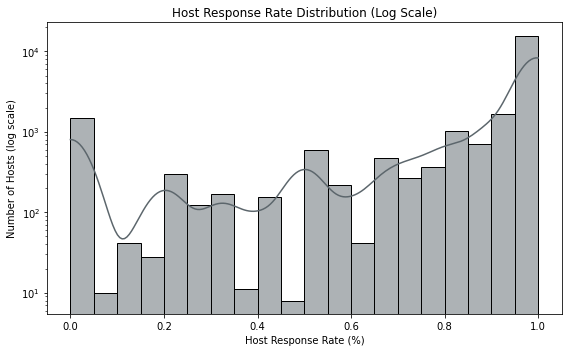

In [0]:
# Filter out null values (invalid response rates)
df_response_filtered = df.filter(col("host_response_rate").isNotNull())

# Convert to Pandas for plotting
response_rate_data = df_response_filtered.select("host_response_rate").toPandas()

# Plot
plt.figure(figsize=(8,5))
sns.histplot(data=response_rate_data, x="host_response_rate", bins=20, kde=True, color="#5C666C")
plt.yscale('log')  
plt.title("Host Response Rate Distribution (Log Scale)")
plt.xlabel("Host Response Rate (%)")
plt.ylabel("Number of Hosts (log scale)")
plt.tight_layout()
plt.show()

__`INFO:`__ Since alomst 2/3 of the values are null, there is not sufficient information to conclude if it is not missing at random and imputation will bias our model, this feature will be dropped.

In [0]:
cols_to_drop.append('host_response_rate')

### 6.6. Host Acceptance Rate

In [0]:
inspect_missing(df, 'host_acceptance_rate')

host_acceptance_rate: 32,738 missing out of 64,657 → 50.63% missing

Showing 10 random rows where `host_acceptance_rate` IS NULL:


listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
19578091,chambre calme sur jardin privatif paris,137609989,2017-06-29,FR,null,null,null,0,1,1,0,Menilmontant,null,Paris,48.8702,2.40941,Private room in condominium,Private room,2,1,"[""Washer"", ""Wifi"", ""Breakfast""]",37,2,4,null,null,null,null,null,null,null,1
7971203,Lovely apartment - Bercy,6585749,2013-05-26,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Reuilly,null,Paris,48.83743,2.39033,Entire apartment,Entire place,3,1,"[""Shampoo"", ""Heating"", ""Iron"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace""]",68,2,1125,100,10,9,10,10,7,10,0
17630839,"â˜€ï¸Apartment near to ""Paris Expo de Versailles""â˜€ï¸",9740819,2013-10-31,"Cachan, Ile-de-France, France",null,null,null,0,1,1,1,Observatoire,null,Paris,48.82726,2.3184,Entire apartment,Entire place,2,1,"[""Heating"", ""Washer"", ""Hair dryer"", ""Dedicated workspace"", ""Smoke alarm"", ""Kitchen"", ""Essentials"", ""Hangers"", ""Long term stays allowed""]",55,4,1125,100,9,9,9,9,9,8,0
46429314,Belle chambre refaite Ã neuf,243929653,2019-02-18,FR,null,null,null,0,1,1,0,Passy,null,Paris,48.8427,2.25903,Private room in apartment,Private room,1,1,"[""Heating"", ""TV"", ""Iron"", ""Essentials"", ""Hair dryer"", ""Hot water"", ""Smoke alarm"", ""Wifi"", ""Elevator"", ""Long term stays allowed""]",60,1,365,null,null,null,null,null,null,null,0
11770512,Appartment in Montmartre,8239635,2013-08-18,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Buttes-Montmartre,null,Paris,48.89162,2.34388,Private room in apartment,Private room,2,1,"[""Shampoo"", ""First aid kit"", ""Heating"", ""TV"", ""Iron"", ""Paid parking on premises"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Washer"", ""Breakfast"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Elevator"", ""Dedicated workspace"", ""Host greets you"", ""Cable TV""]",85,1,6,100,10,10,10,10,10,10,1
20012786,Cosy apartment near PÃ¨re Lachaise cementery,142072829,2017-07-23,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Menilmontant,null,Paris,48.87324,2.40279,Entire apartment,Entire place,2,1,"[""Iron"", ""Heating"", ""Washer"", ""Hair dryer"", ""Dedicated workspace"", ""Smoke alarm"", ""Wifi"", ""Kitchen"", ""Elevator"", ""Essentials"", ""Hangers"", ""Private entrance"", ""Long term stays allowed""]",60,4,1125,null,null,null,null,null,null,null,1
553470,54m2 au coeur de Paris - Republique,2719942,2012-06-23,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Temple,null,Paris,48.86848,2.35803,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"", ""Cable TV""]",119,3,14,98,10,8,10,10,8,10,0
7855469,Very cosy flat in Paris,9663466,2013-10-27,"Paris, Ile-de-France, France",null,null,null,0,4,1,1,Opera,null,Paris,48.87652,2.34759,Private room in apartment,Private room,1,1,"[""Heating"", ""TV"", ""Iron"", ""Indoor fireplace"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Carbon monoxide alarm"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]",42,2,1125,100,10,9,10,10,9,10,0
38309167,Modern Studio near Tour Eiffel & Champ de Mars,290531413,2019-08-31,"Paris, Ile-de-France, France",null,null,null,0,0,1,1,Vaugirard,null,Paris,48.84249,2.3076,Entire apartment,Entire place,3,null,"[""Cooking basics"", ""Garden or backyard"", ""Babysitter recommendations"", ""Heating"", ""Paid parking on premises"", ""Luggage dropoff allowed"

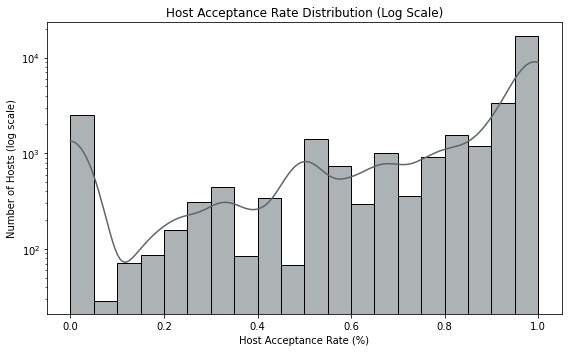

In [0]:
# Filter out null values (invalid acceptance rates)
df_acceptance_filtered = df.filter(col("host_acceptance_rate").isNotNull())

# Convert to Pandas for plotting
acceptance_rate_data = df_acceptance_filtered.select("host_acceptance_rate").toPandas()

# Plot
plt.figure(figsize=(8,5))
sns.histplot(data=acceptance_rate_data, x="host_acceptance_rate", bins=20, kde=True, color="#5C666C")
plt.yscale('log')  
plt.title("Host Acceptance Rate Distribution (Log Scale)")
plt.xlabel("Host Acceptance Rate (%)")
plt.ylabel("Number of Hosts (log scale)")
plt.tight_layout()
plt.show()

__`INFO:`__ Since alomst 1/2 of the values are null; there is not sufficient information to conclude if it is not missing at random; and imputation will bias our model, this feature will be dropped.

In [0]:
cols_to_drop.append('host_acceptance_rate')

### 6.7. Host Total Listing Count

In [0]:
# Filter rows where host_total_listings_count == 0
zero_df = df.filter(col("host_total_listings_count") == 0)

# Count how many such rows there are
zero_count = zero_df.count()
print(f"Number of rows with host_total_listings_count = 0: {zero_count:,}")
display(zero_df.limit(10))

Number of rows with host_total_listings_count = 0: 8,607


listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
47355968,Charmant appartement parisien - 2/4 voyageurs,11716309,2014-01-28,"Paris, Ile-de-France, France",within a few hours,0.88,0.33,0,0,1,1,Menilmontant,null,Paris,48.8738,2.39408,Entire apartment,Entire place,4,1,"[""Shampoo"", ""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Essentials"", ""Breakfast"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed""]",55,5,1125,100,10,10,10,8,8,8,0
840429,Beautiful studio Menilmontant,4389298,2012-12-12,"Paris, Ile-de-France, France",within a day,0.9,0.57,0,0,1,1,Menilmontant,null,Paris,48.86739,2.38578,Entire apartment,Entire place,2,1,"[""Heating"", ""Kitchen"", ""Washer"", ""Dryer"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]",43,5,1125,88,9,8,9,9,9,9,0
1272342,Charming Studio Paris Centre,6618901,2013-05-28,"Paris, Ile-de-France, France",within a few hours,0.75,0.5,0,0,1,1,Enclos-St-Laurent,null,Paris,48.87552,2.35488,Entire apartment,Entire place,2,1,"[""Shampoo"", ""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Hair dryer"", ""Washer"", ""Carbon monoxide alarm"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Dishes and silverware"", ""Elevator"", ""Long term stays allowed"", ""Dedicated workspace"", ""Cable TV""]",35,15,1125,81,9,8,10,10,9,8,0
3633049,Cosy appartment/Nid douillet 20Ã¨me,18315024,2014-07-18,"Paris, Ile-de-France, France",within a few hours,0.63,1.0,0,0,1,1,Menilmontant,null,Paris,48.87072,2.40811,Entire apartment,Entire place,4,1,"[""Essentials"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace"", ""High chair"", ""Host greets you"", ""Paid parking on premises"", ""TV"", ""Iron"", ""Free street parking"", ""Hot tub"", ""Heating"", ""Kitchen"", ""Hair dryer"", ""Washer"", ""Cable TV"", ""Shampoo"", ""Extra pillows and blankets"", ""Bed linens"", ""Carbon monoxide alarm"", ""Elevator""]",49,9,1125,96,10,9,9,10,9,9,0
6949834,Charming sunny apt. on small garden,36437406,2015-06-22,"Neuilly-sur-Seine, Ile-de-France, France",a few days or more,0.0,0.5,0,0,1,1,Buttes-Montmartre,null,Paris,48.8878,2.35207,Entire apartment,Entire place,2,1,"[""Shampoo"", ""Garden or backyard"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Refrigerator"", ""Wifi"", ""Dishes and silverware"", ""Elevator"", ""Long term stays allowed""]",60,7,1125,96,10,10,10,10,9,10,0
11314689,appartement Ã Montmartre,12827900,2014-03-05,"Paris, Ile-de-France, France",within a few hours,0.88,0.6,0,0,1,1,Buttes-Montmartre,null,Paris,48.88962,2.34599,Entire apartment,Entire place,2,1,"[""Shampoo"", ""Extra pillows and blankets"", ""Heating"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Washer"", ""Dryer"", ""Bed linens"", ""Hot water"", ""Hangers"", ""Carbon monoxide alarm"", ""Smoke alarm"", ""Wifi"", ""Fire extinguisher"", ""Long term stays allowed"", ""Dedicated workspace"", ""Host greets you""]",70,4,1125,96,9,10,10,10,9,10,0
42559419,3 PiÃ¨ces Champs-Elysees,339001941,2020-02-26,FR,a few days or more,0.0,1.0,0,0,1,0,Elysee,null,Paris,48.87003,2.30115,Entire apartment,Entire place,5,2,"[""Shampoo"", ""Heating"", ""TV"", ""Iron"", ""Indoor fireplace"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Washer"", ""Dryer"", ""Air conditioning"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace""]",100,7,1125,20,2,2,2,2,2,2,1
44071938,Appartement 110 m2 Paris 1er,353402016,2020-07-04,FR,a few days or more,0.4,1.0,0,0,1,0,Louvre,null,Paris,48.85838,2.34189,Entire ap

__`INFO:`__ Checking if there is an inconsistent between `host_id` and `host_total_listings_count`

In [0]:
# 1) Identify host_ids where host_total_listings_count varies
inconsistent_hosts = (
    df
    .groupBy("host_id")
    .agg(countDistinct("host_total_listings_count").alias("distinct_count"))
    .filter(col("distinct_count") > 1)
    .select("host_id")
)

# 2) Join back to df to pull all rows for those hosts, then order by host_id
inconsistent_rows = (
    df
    .join(inconsistent_hosts, on="host_id", how="inner")
    .orderBy("host_id")
)

# 3) Display the problematic rows
display(inconsistent_rows)


host_id,listing_id,name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable


__`INFO:`__ Grouping by `host_id` and counting lisitings to input in `host_total_listings_count`

In [0]:
# 1) For hosts with host_total_listings_count == 0, count how many listings they actually have
zero_counts = (
    df
    .filter(col("host_total_listings_count") == 0)
    .groupBy("host_id")
    .agg(count("*").alias("actual_listings"))
)

# 2) Left-join these counts back to the original DataFrame
df_with_counts = df.join(zero_counts, on="host_id", how="left")

# 3) Overwrite host_total_listings_count only where it was 0
df = df_with_counts.withColumn(
    "host_total_listings_count",
    when(
        col("host_total_listings_count") == 0,
        col("actual_listings")
    ).otherwise(col("host_total_listings_count"))
).drop("actual_listings")



__`INFO:`__ Sanity check if changes had any effect.

In [0]:
# Filter rows where host_total_listings_count == 0
zero_df = df.filter(col("host_total_listings_count") == 0)

# Count how many such rows there are
zero_count = zero_df.count()
print(f"Number of rows with host_total_listings_count = 0: {zero_count:,}")
display(zero_df)

Number of rows with host_total_listings_count = 0: 0


host_id,listing_id,name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable


### 6.8. Latitude and Longitude
 
__`INFO:`__ Geographic details is already captured by the `neighbourhood` feature. That is why we decided to drop it. 

In [0]:
cols_to_drop.append('latitude')
cols_to_drop.append('longitude')

### 6.9. Accommodates

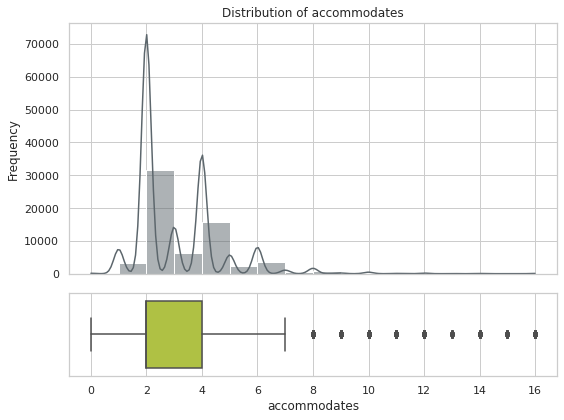

In [0]:
plot_dist_and_box(df, cols = 'accommodates', bins = 16)

__`INFO:`__

- **1. Winsorization of High `accommodates` Values:**
At higher ranges, differences between individual `accommodates` counts become negligible. To preserve the meaning of these large values while improving distribution, we will apply winsorization during preprocessing.

- **2. Dropping and Imputing Zero `accommodates` Values:**
An `accommodates` value of zero is do not make sense for an Airbnb listing. We will remove those values and later impute missing `accommodates` values in the training set using the median.

In [0]:
df = df.withColumn(
    "accommodates",
    when(df["accommodates"] == 0, lit(None)).otherwise(df["accommodates"])
)

### 6.10. Bedrooms

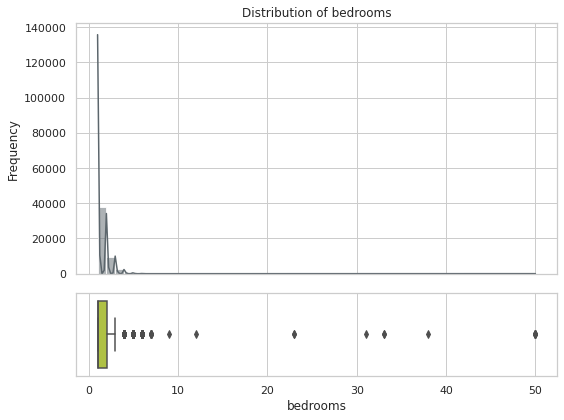

In [0]:
plot_dist_and_box(df, cols = 'bedrooms', bins = 50)

In [0]:
# Count rows where bedrooms > 2000
high_bedrooms_count = df.filter(col("bedrooms") > 10).count()

print(f"Number of rows with bedrooms > 10: {high_bedrooms_count:,}")

Number of rows with bedrooms > 10: 14


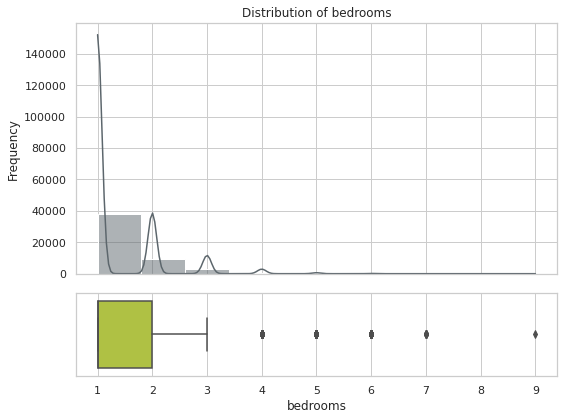

In [0]:
# 1) Filter out rows where bedrooms is zero or greater than 10
df = df.filter(
    col("bedrooms").isNull() | (col("bedrooms") <= 10)
)

# 2) Plot on the filtered DataFrame
plot_dist_and_box(df, cols="bedrooms", bins=10)


In [0]:
df_shape(df)

64643 rows × 33 columns


__`INFO:`__ At higher ranges, differences between individual `bedrooms` counts become negligible. To preserve the meaning of these large values while improving distribution, we will apply winsorization during preprocessing.

### 6.10. Price (TARGET)

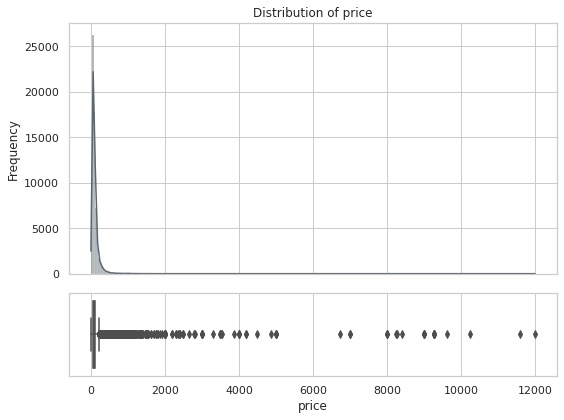

In [0]:
plot_dist_and_box(df, cols = 'price', bins = 300)

In [0]:
# Count rows where price > 2000
high_price_count = df.filter(col("price") > 500).count()

print(f"Number of rows with price > 500: {high_price_count:,}")

Number of rows with price > 500: 821


__`INFO:`__ To improve our data distribution and prevent bias in the model, we dropped all listings with a `price` above 500—these values are not representative of the majority of our dataset—and also removed any listings where `price` was zero, since a zero price does not make sense for an Airbnb listing.

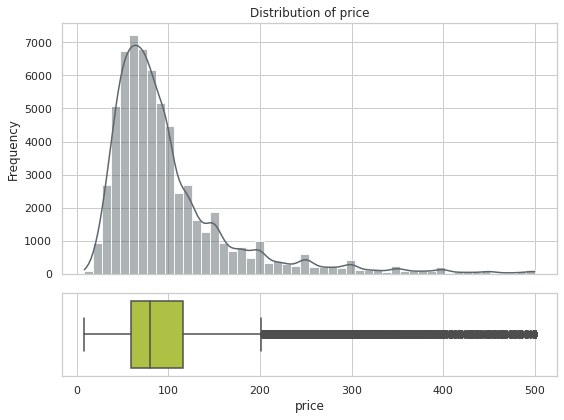

In [0]:
# 1) Filter out rows where price is zero or greater than 500
df = df.filter((col("price") > 0) & (col("price") <= 500))

# 2) Plot on the filtered DataFrame
plot_dist_and_box(df, cols="price", bins=50)


### 6.11. Minimum Nights 

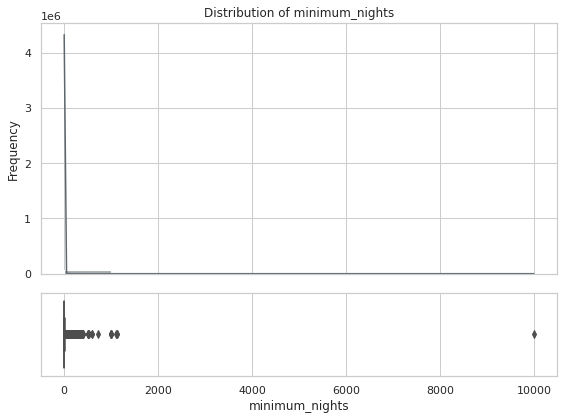

In [0]:
plot_dist_and_box(df, cols = 'minimum_nights', bins = 10)

In [0]:
# Count rows where minimum_nights > 40
high_price_count = df.filter(col("minimum_nights") > 40).count()

print(f"Number of rows with minimum_nights > 40: {high_price_count:,}")

Number of rows with minimum_nights > 40: 813


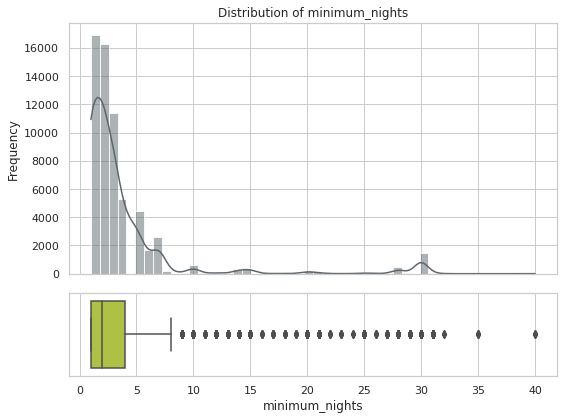

In [0]:
# 1) Filter out rows where minimum_nights is zero or greater than 40
df_filtered = df.filter(col("minimum_nights") <= 40)

# 2) Plot on the filtered DataFrame
plot_dist_and_box(df_filtered, cols="minimum_nights", bins=50)


### 6.12. Maximum Nights 

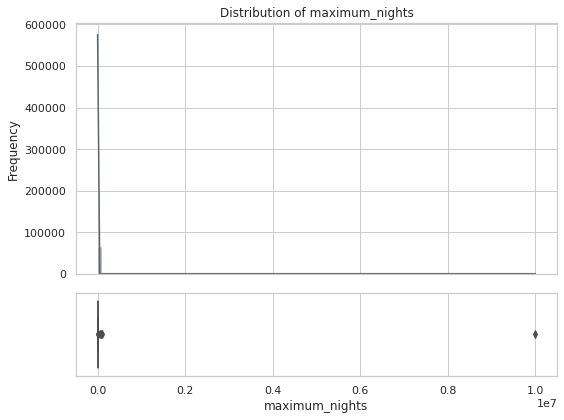

In [0]:
plot_dist_and_box(df, cols = 'maximum_nights', bins = 100)

__`INFO:`__ Drop clear outlier to improve visualization

In [0]:
# Count rows where price > 1150
high_max_nights_count = df.filter(col("maximum_nights") > 1150).count()

print(f"Number of rows with maximum_nights > 1150: {high_max_nights_count:,}")

Number of rows with maximum_nights > 1150: 10


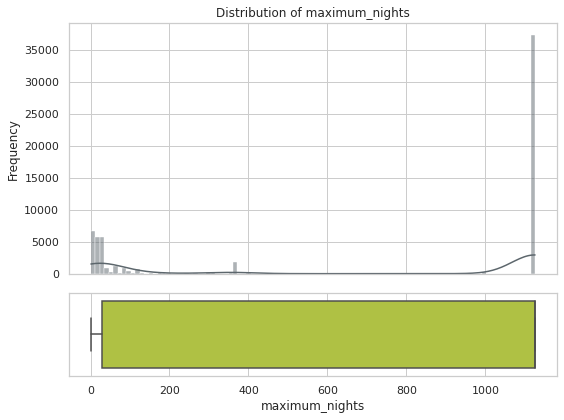

In [0]:
df = df.filter(col("maximum_nights") <= 1150)

plot_dist_and_box(df, cols = 'maximum_nights', bins = 100)

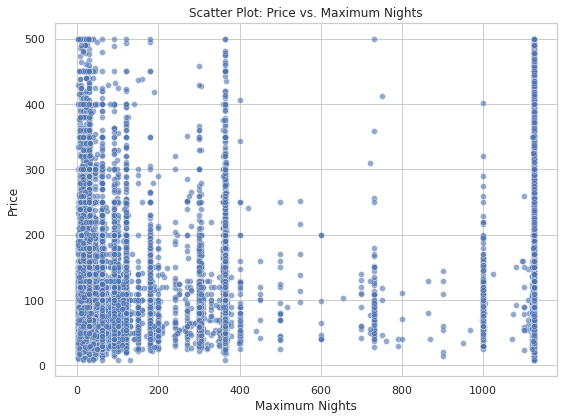

In [0]:
# Replace `df_listings` with your actual DataFrame name
pdf = df.select("price", "maximum_nights").dropna().toPandas()

plt.figure(figsize=(8, 6))
sns.scatterplot(data=pdf, x="maximum_nights", y="price", palette=main_palette,alpha=0.6)
plt.xlabel("Maximum Nights")
plt.ylabel("Price")
plt.title("Scatter Plot: Price vs. Maximum Nights")
plt.tight_layout()
plt.show()

__`INFO:`__ Since distribution is highly skewed and scatter with target don't seems to carry much information about it we will drop this feature later

In [0]:
cols_to_drop.append('maximum_nights')

### 6.13. All Review Scores 

In [0]:
review_cols = [
    'review_scores_rating', 
    'review_scores_accuracy', 
    'review_scores_cleanliness', 
    'review_scores_checkin', 
    'review_scores_communication', 
    'review_scores_location', 
    'review_scores_value'
    ]

In [0]:
count_null_overlaps(df, review_cols)

Rows with all 7 columns null at once: 16,192
❌ Found 102 rows with some nulls but not all.
Out[57]: (16192, 102)

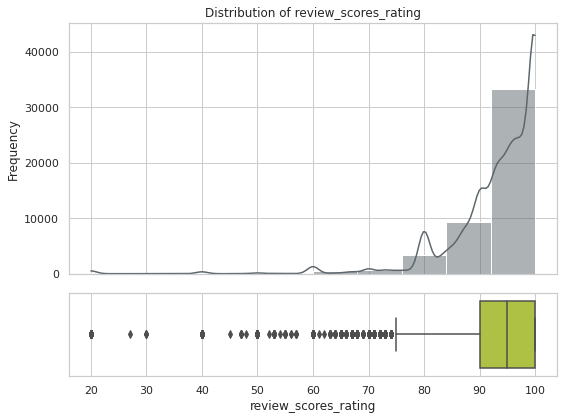

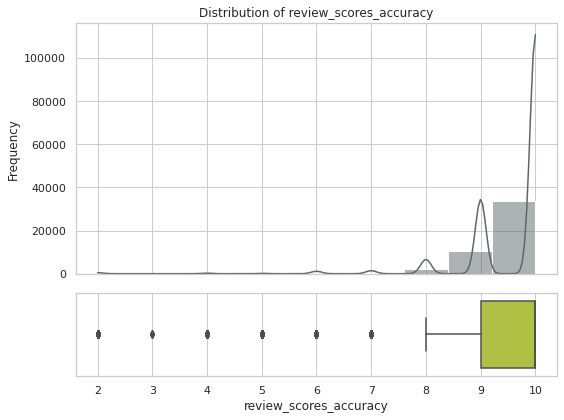

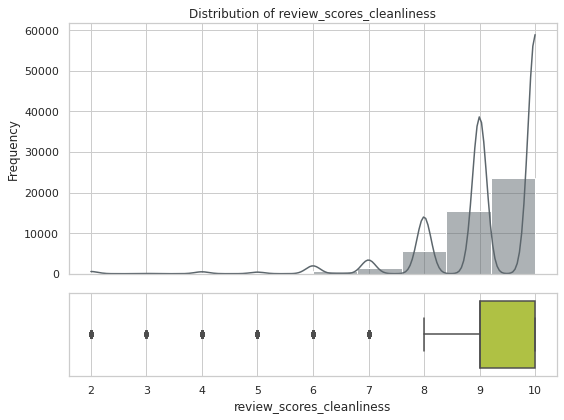

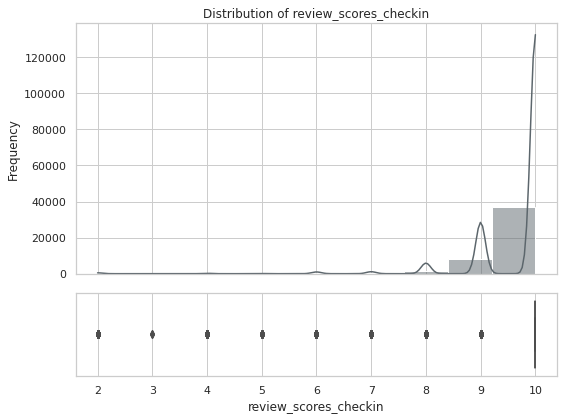

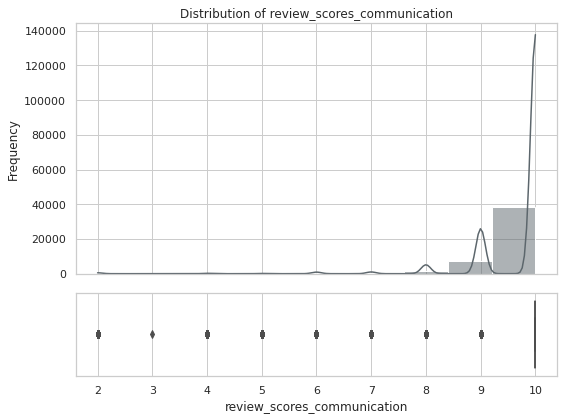

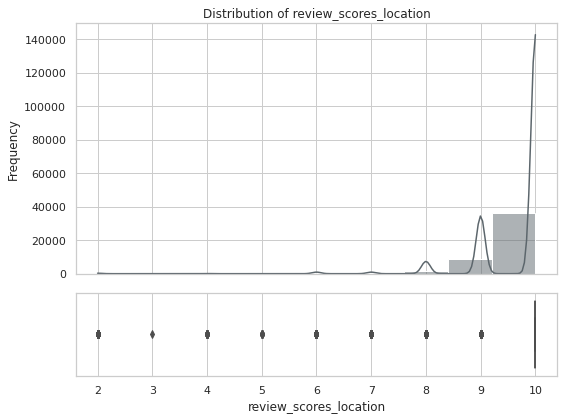

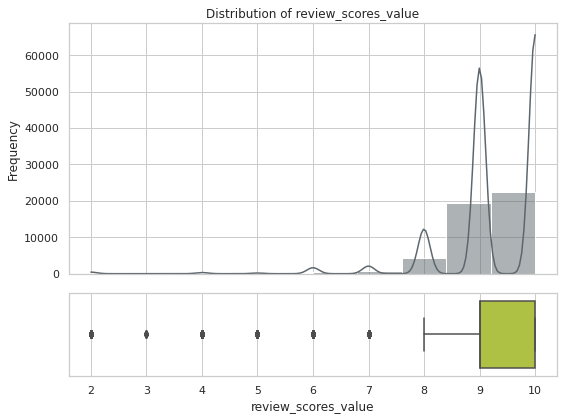

In [0]:
plot_dist_and_box(df, review_cols, bins = 10)

__`INFO:`__ The distributions of individual review scores are highly skewed and redundant, so we will keep only `review_scores_rating`, which encapsulates all other review metrics. Any missing values in this column will be imputed with the median during preprocessing.


In [0]:
cols_to_drop.append('review_scores_accuracy')
cols_to_drop.append('review_scores_cleanliness')
cols_to_drop.append('review_scores_checkin')
cols_to_drop.append('review_scores_communication')
cols_to_drop.append('review_scores_location')
cols_to_drop.append('review_scores_value')

## 7. Binary Features
### 7.1. Is Super Host ? 

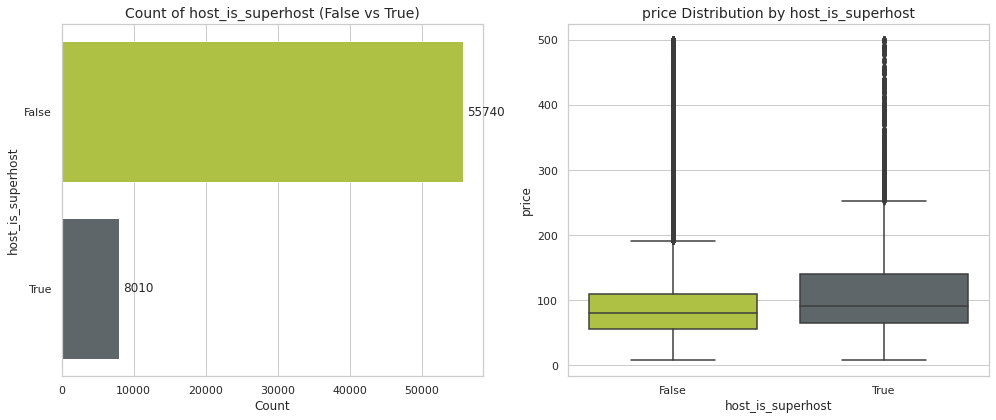

In [0]:
plot_binary_with_target(df, "host_is_superhost", 'price')


### 7.2. Has Profile Pic ?

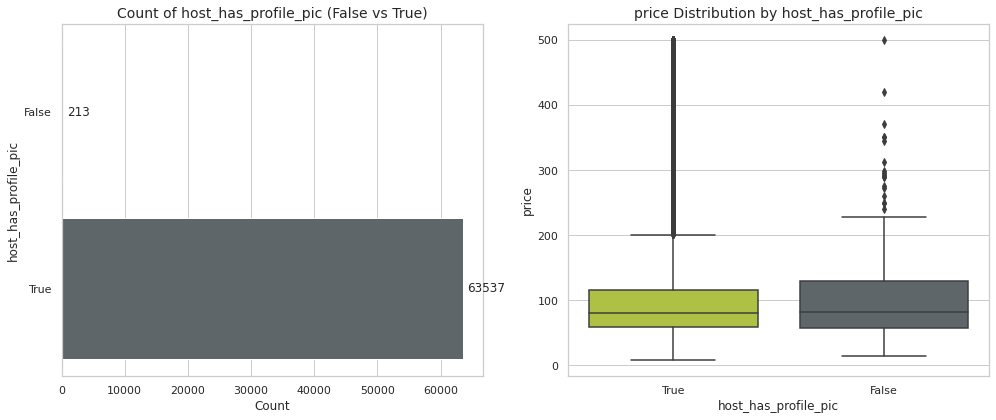

In [0]:
plot_binary_with_target(df, "host_has_profile_pic", 'price')


### 7.3. Has Identity Verified ?


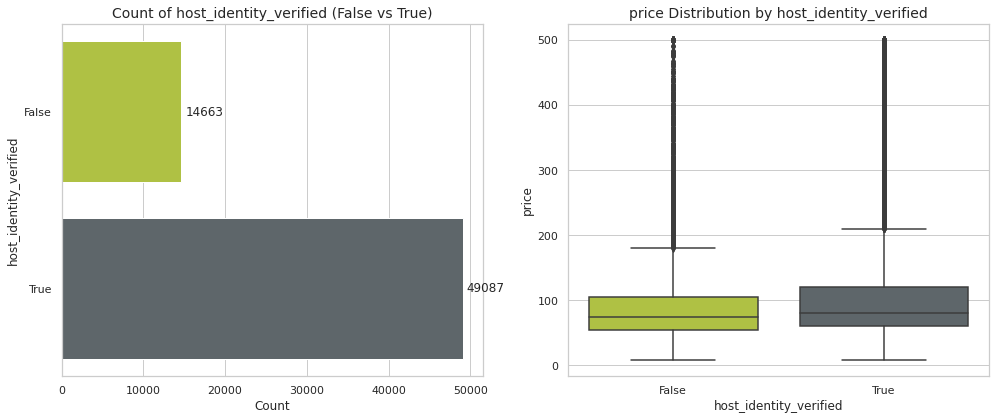

In [0]:
plot_binary_with_target(df, "host_identity_verified", 'price')

### 7.3. Is Instant Bookable ?

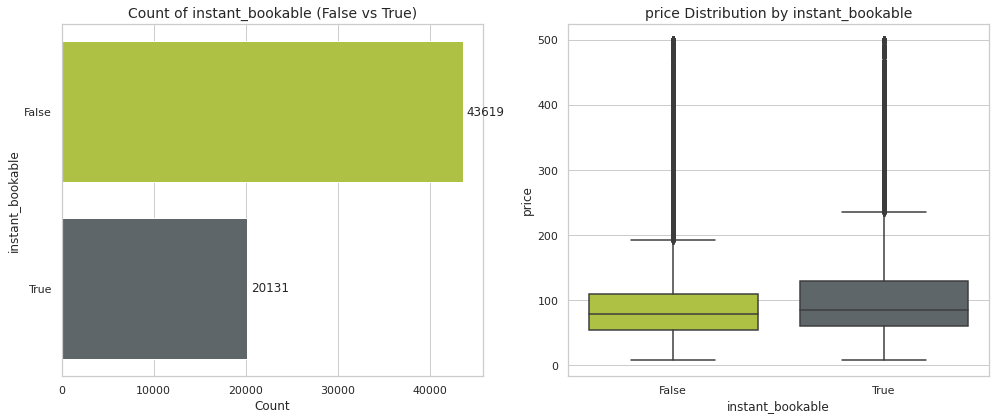

In [0]:
plot_binary_with_target(df, "instant_bookable", 'price')

## 8. Categorical Features

### 8.1 Name


__`INFO:`__ Extracting meaningful insights from this feature would require an NLP model, which is beyond the scope of this project. Therefore, we will drop this feature.



In [0]:
cols_to_drop.append('name')

### 8.2 Host Location 

In [0]:
distinct_locations = df.select("host_location").distinct()
print(f"Distinct host_location values count: {distinct_locations.count()}")
distinct_locations.show(truncate=False)

Distinct host_location values count: 2203
+-----------------------------------------------------------+
|host_location                                              |
+-----------------------------------------------------------+
|Lyon, Rhone-Alpes, France                                  |
|Toulouse, Languedoc-Roussillon-Midi-Pyrenees, France       |
|null                                                       |
|Hericy, Ile-de-France, France                              |
|Mexico City, Federal District, Mexico                      |
|Pau, Aquitaine-Limousin-Poitou-Charentes, France           |
|Caen, Lower Normandy, France                               |
|Raray, Hauts-de-France, France                             |
|Metz, Lorraine, France                                     |
|FR                                                         |
|Nizhny Novgorod, Nizhny Novgorod Oblast, Russia            |
|Ã‰ragny, Ile-de-France, France                             |
|Saint-Pierre-du-Perray, Ile

__`INFO:`__ The `host_location` feature offers limited predictive value since hosts can be anywhere in the world. We will drop this column.


In [0]:
cols_to_drop.append('host_location')

### 8.3 City 

__`INFO:`__ Because we filtered to include only listings in Paris, the `city` feature is now constant. We will drop this feature.


In [0]:
cols_to_drop.append('city')

### 8.4 District 

In [0]:
inspect_missing(df, 'district')

district: 63,750 missing out of 63,750 → 100.00% missing

Showing 10 random rows where `district` IS NULL:


host_id,listing_id,name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
250903794,33311450,Ambiance sous les toits de Paris,2019-03-24,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Batignolles-Monceau,null,Paris,48.88257,2.30882,Entire apartment,Entire place,2,null,"[""Shampoo"", ""Heating"", ""Essentials"", ""Hair dryer"", ""Coffee maker"", ""Bed linens"", ""Hot water"", ""Smoke alarm"", ""Dishes and silverware"", ""Private entrance""]",74,2,6,99,10,10,10,10,10,10,0
161397726,41396570,Beautiful room in Big aprtment with Montmarte view,2017-12-05,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Buttes-Chaumont,null,Paris,48.89494,2.37884,Private room in apartment,Private room,2,1,"[""Shampoo"", ""Heating"", ""Dedicated workspace"", ""Smoke alarm"", ""Wifi"", ""Kitchen"", ""Fire extinguisher"", ""Essentials"", ""Hangers""]",38,1,7,90,9,9,10,10,10,10,0
340545,48063508,Chambre donnant sur un jardin,2011-01-09,"Paris, Ile-de-France, France",within a few hours,0.67,null,0,1,1,0,Popincourt,null,Paris,48.86306,2.37861,Private room in guesthouse,Private room,1,1,"[""Private entrance"", ""Shampoo"", ""Lock on bedroom door"", ""Heating"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Washer"", ""Dryer"", ""Hangers"", ""Wifi"", ""Fire extinguisher"", ""Long term stays allowed"", ""Dedicated workspace""]",27,3,28,null,null,null,null,null,null,null,0
6502559,28224439,Two cosy rooms - Parisian Haussmann Apartment.,2013-05-21,"Paris, Ile-de-France, France",a few days or more,0.0,null,0,1,1,1,Popincourt,null,Paris,48.85133,2.39225,Entire apartment,Entire place,2,1,"[""Oven"", ""Heating"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Kitchen"", ""Dishes and silverware"", ""Refrigerator"", ""Cooking basics"", ""Essentials"", ""Hangers"", ""Long term stays allowed"", ""TV"", ""Stove"", ""Carbon monoxide alarm"", ""Microwave""]",50,6,1125,100,10,10,10,10,10,10,0
49237581,9640467,"Bulle, 2BR/2BA, 6 people",2015-11-17,"Paris, Ile-de-France, France",within a few hours,0.8,0.89,0,62,1,1,Temple,null,Paris,48.86187,2.3534,Entire apartment,Entire place,6,2,"[""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Hair dryer"", ""Washer"", ""Bed linens"", ""Hot water"", ""Hangers"", ""Wifi"", ""Cooking basics"", ""Long term stays allowed"", ""Dedicated workspace"", ""Cable TV""]",238,3,1125,89,9,9,9,9,10,9,1
34658124,6986942,Studio dans le 12Ã¨me,2015-05-31,"Paris, Ile-de-France, France",null,null,null,0,2,1,1,Reuilly,null,Paris,48.84691,2.39651,Entire apartment,Entire place,2,null,"[""Heating"", ""Kitchen"", ""Essentials"", ""Wifi"", ""Long term stays allowed"", ""Cable TV""]",39,5,1125,90,10,10,10,10,10,9,0
338962390,42553986,Sublime Studio d'architect proche Champs Elysees,2020-02-26,"Paris, Ile-de-France, France",null,null,1.0,0,1,1,1,Passy,null,Paris,48.86632,2.2751,Entire apartment,Entire place,2,null,"[""Shower gel"", ""Dishes and silverware"", ""Hangers"", ""Carbon monoxide alarm"", ""Coffee maker"", ""Breakfast"", ""Iron"", ""Dryer"", ""Dedicated workspace"", ""Smoke alarm"", ""First aid kit"", ""Body soap"", ""Essentials"", ""Bed linens"", ""TV"", ""Shampoo"", ""Heating"", ""Washer"", ""Extra pillows and blankets"", ""Cable TV"", ""Kitchen"", ""Refrigerator"", ""Cooking basics"", ""Free street parking"", ""Hot water"", ""Paid street parking off premises"", ""Hair dryer"", ""Wifi"", ""Portable fans"", ""Long term stays allowed"", ""Laundromat nearby"", ""Microwave""]",75,1,1125,88,9,10,9,9,10,9,0
133239047,26175988,Studio calme et agreable Ã vivre.,2017-06-03,"Sainte-MÃ¨re-Ã‰glise, Normandy, France",null,null,n

__`INFO:`__ Due to the high number of missing value we decided to drop this feature. 



In [0]:
cols_to_drop.append('district')

### 8.5. Host Responses Time

In [0]:
inspect_missing(df, 'host_response_time')

host_response_time: 40,983 missing out of 63,750 → 64.29% missing

Showing 10 random rows where `host_response_time` IS NULL:


host_id,listing_id,name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
29382043,5766728,"Studio lumineux et calme, Paris Belleville",2015-03-15,"Paris, Ile-de-France, France",null,null,0.0,0,1,1,1,Enclos-St-Laurent,null,Paris,48.87165,2.37539,Entire apartment,Entire place,2,null,"[""Pocket wifi"", ""Essentials"", ""Stove"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Luggage dropoff allowed"", ""Long term stays allowed"", ""Dedicated workspace"", ""Host greets you"", ""Iron"", ""Refrigerator"", ""Oven"", ""Dishes and silverware"", ""Heating"", ""Kitchen"", ""Breakfast"", ""Coffee maker"", ""Washer"", ""Hair dryer"", ""Cooking basics"", ""Fire extinguisher"", ""Paid parking off premises"", ""Shampoo"", ""Bed linens""]",60,1,1125,99,10,9,10,10,10,10,0
75927669,13371088,Belle chambre Ã Montmartre,2016-06-05,"Montpellier, Occitanie, France",null,null,0.5,0,3,1,1,Buttes-Montmartre,null,Paris,48.8924,2.35036,Private room in apartment,Private room,2,1,"[""Iron"", ""Heating"", ""Washer"", ""Elevator"", ""Hair dryer"", ""Wifi"", ""Kitchen"", ""Smoke alarm"", ""Essentials"", ""Long term stays allowed""]",34,2,1125,100,10,10,10,10,10,10,0
333392718,42063487,studio at 9eme paris near la fayette,2020-02-04,"Villejuif, Ile-de-France, France",null,null,1.0,0,1,1,1,Opera,null,Paris,48.87886,2.34526,Entire apartment,Entire place,2,1,"[""Shampoo"", ""Hot water kettle"", ""Hot tub"", ""Heating"", ""Shower gel"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Bed linens"", ""Refrigerator"", ""Hot water"", ""Hangers"", ""Microwave"", ""Cooking basics"", ""Dishes and silverware"", ""Long term stays allowed"", ""Private entrance""]",70,1,30,82,9,8,10,10,10,9,1
9965780,38518077,Charmant studio proche Gare de Lyon et nation,2013-11-12,"Paris, Ile-de-France, France",null,null,null,0,2,1,1,Reuilly,null,Paris,48.84645,2.38924,Entire apartment,Entire place,2,null,"[""Shampoo"", ""Washer"", ""Dryer"", ""Elevator"", ""Hair dryer"", ""Kitchen"", ""Smoke alarm"", ""First aid kit"", ""Essentials"", ""Hot water"", ""Long term stays allowed"", ""Hangers"", ""Breakfast""]",92,365,365,100,10,10,10,10,10,10,0
25250101,4904433,COSY APPARTEMENT IN PARIS FAUBOURG,2014-12-27,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Popincourt,null,Paris,48.86813,2.37245,Entire apartment,Entire place,2,1,"[""Heating"", ""Kitchen"", ""Washer"", ""Dryer"", ""Smoke alarm"", ""Wifi"", ""Elevator"", ""Long term stays allowed""]",120,2,1125,null,null,null,null,null,null,null,0
1387795,5420822,Charming flat near Montmartre,2011-11-09,"Paris, Ile-de-France, France",null,null,0.5,0,1,1,1,Buttes-Montmartre,null,Paris,48.8939,2.36265,Entire apartment,Entire place,2,1,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",45,3,1125,92,9,8,9,9,9,9,0
5362618,7626259,Charming and well located 45m2 flat,2013-03-07,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Batignolles-Monceau,null,Paris,48.88822,2.31572,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Wifi"", ""Long term stays allowed"", ""Cable TV""]",55,5,1125,null,null,null,null,null,null,null,1
31837691,17508012,"Chic Studio in Victor Hugo, Paris 16",2015-04-24,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Passy,null,Paris,48.8689,2.27839,Entire apartment,Entire place,2,null,"[""Iron"", ""Shampoo"", ""Heating"", ""Washer"", ""Hair dryer"", ""Dedicated workspace"", ""Smoke alarm"", ""Wifi"", ""Kitchen"", ""Elevator"", ""Essentials"", ""Hangers"", ""Breakfast""]",60,7,16,100,10,1

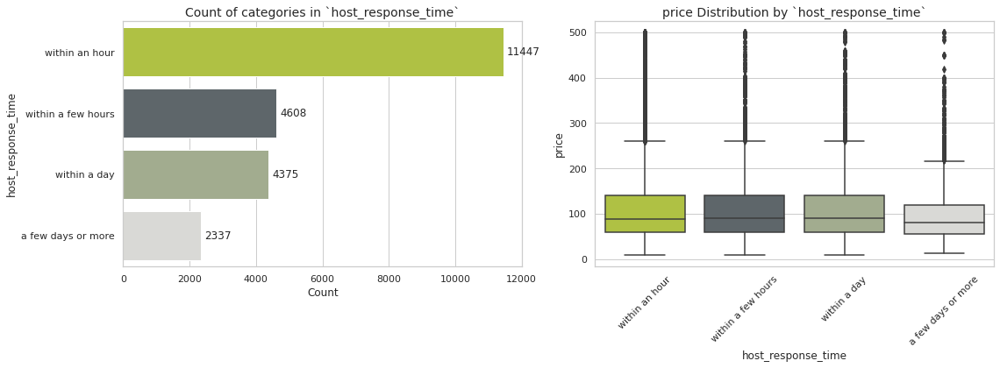

In [0]:
plot_categorical_with_target(df, "host_response_time", "price")

__`INFO:`__ Due to the high number of missing value and not much difference when compared with target variable we decided to drop this feature. 



In [0]:
cols_to_drop.append('host_response_time')

### 8.6 Property Type

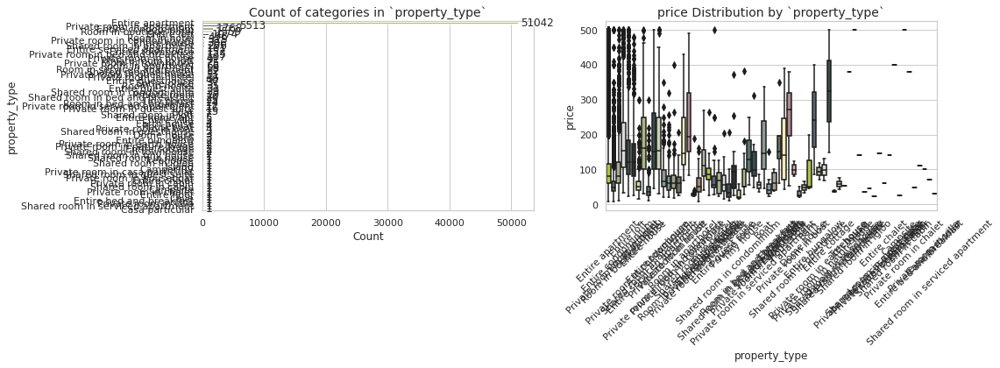

In [0]:
plot_categorical_with_target(df, "property_type", "price")

In [0]:
unique_property_types = (
    df
    .select("property_type")
    .distinct()
    .rdd
    .flatMap(lambda row: row)
    .collect()
)

print("Unique property_type values:")
for pt in unique_property_types:
    print(f"  - {pt}")

Unique property_type values:
  - Entire apartment
  - Private room in loft
  - Shared room in hostel
  - Entire house
  - Shared room in condominium
  - Room in boutique hotel
  - Room in bed and breakfast
  - Entire guesthouse
  - Entire guest suite
  - Entire place
  - Private room in boat
  - Private room in condominium
  - Private room in chalet
  - Cave
  - Room in aparthotel
  - Entire bed and breakfast
  - Private room in guest suite
  - Shared room in serviced apartment
  - Entire townhouse
  - Room in hotel
  - Entire villa
  - Entire home/apt
  - Earth house
  - Private room in bed and breakfast
  - Entire serviced apartment
  - Entire condominium
  - Private room in cabin
  - Private room in serviced apartment
  - Private room in apartment
  - Private room
  - Entire loft
  - Room in serviced apartment
  - Private room in house
  - Tiny house
  - Boat
  - Private room in villa
  - Private room in guesthouse
  - Entire cottage
  - Private room in townhouse
  - Shared room in 

__`INFO:`__ Due to the high number classes, and similarity among them we will group them in fewer classes in the feature engineering section.



### 8.7 Room Type 

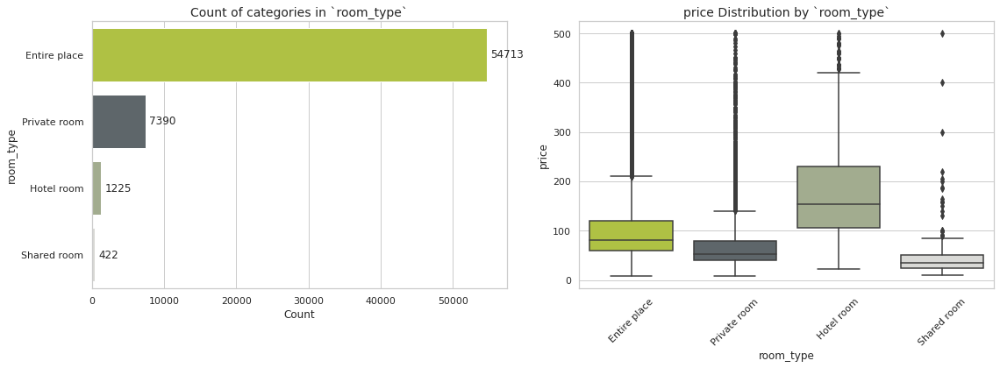

In [0]:
plot_categorical_with_target(df, "room_type", "price")

### 8.8 Neighbourhood

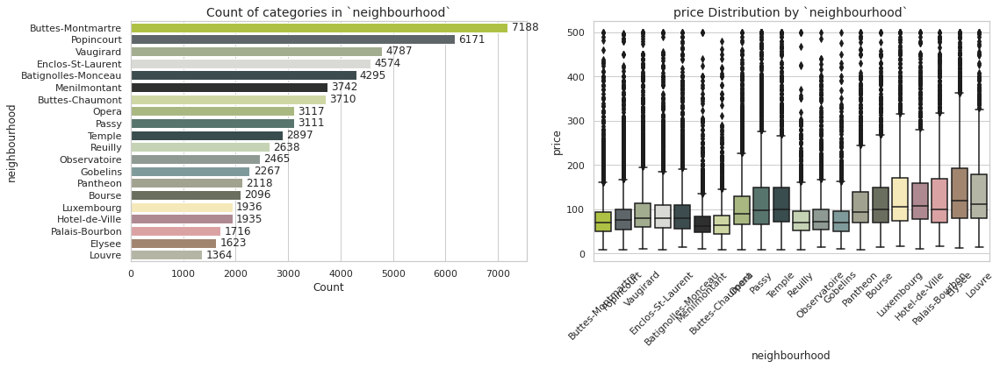

In [0]:
plot_categorical_with_target(df, "neighbourhood", "price")

### 8.9 Amenities

In [0]:
display(df.select('amenities').limit(10))

amenities
"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]"
"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Wifi"", ""Long term stays allowed""]"
"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]"
"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long term stays allowed""]"
"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Dryer"", ""Bathtub"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]"
"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Cable TV""]"
"[""Shampoo"", ""TV"", ""Kitchen"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Fire extinguisher"", ""Long term stays allowed""]"
"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed""]"
"[""Paid parking off premises"", ""Shampoo"", ""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Washer"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace"", ""Host greets you"", ""Cable TV""]"
"[""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Hangers"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Dedicated workspace"", ""Cable TV""]"


__`INFO:`__ This feature is going to be engineered to get extract more meaningful informations



## 9. Feature Engineering
### 9.1 Host Years/Days Active 

In [0]:
max_date = (
    df
    .agg(spark_max("host_since").alias("max_date"))
    .first()["max_date"]
)

df = (
    df
    .withColumn(
        "host_days_active",
        datediff(lit(max_date), col("host_since"))
    )
    .withColumn(
        "host_years_active",
        (col("host_days_active") / 365).cast("int")
    )
)

display(df.select("host_since", "host_days_active", "host_years_active"))

host_since,host_days_active,host_years_active
2011-12-03,3354,9
2013-11-29,2627,7
2014-07-31,2383,6
2013-12-17,2609,7
2014-12-14,2247,6
2011-04-13,3588,9
2013-08-09,2739,7
2013-04-14,2856,7
2015-06-14,2065,5
2014-09-02,2350,6


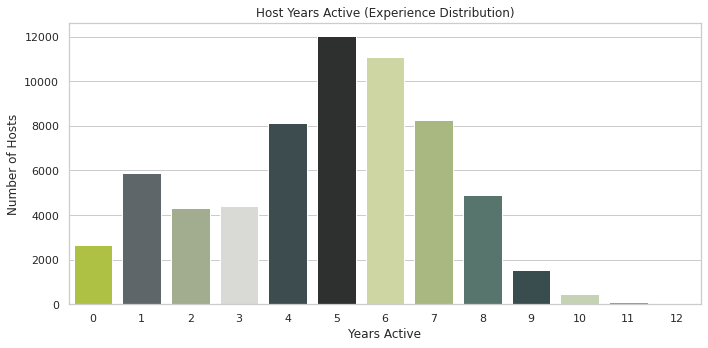

In [0]:
# Filter out invalid values (negative years or nulls)
df_view = df.filter((col("host_years_active") >= 0) & (col("host_years_active").isNotNull()))

# Group and plot
years_active = df_view.groupBy("host_years_active").count().orderBy("host_years_active").toPandas()

# Plot
plt.figure(figsize=(10,5))
sns.barplot(data=years_active, x="host_years_active", y="count", palette=main_palette)
plt.title("Host Years Active (Experience Distribution)")
plt.xlabel("Years Active")
plt.ylabel("Number of Hosts")
plt.tight_layout()
plt.show()

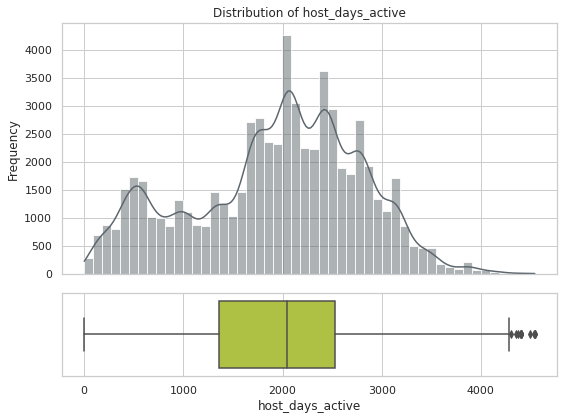

In [0]:
plot_dist_and_box(df, "host_days_active", bins = 50)

In [0]:
numeric_cols.append('host_days_active')
numeric_cols.append('host_years_active')


### 9.2 Property Type New Groups

- Next we group these property types in categories. These categories will be "entire_place", "private_room", "shared_room", "unique_stays" and "hotel_boutique".<br>

| Category                       | Description |
|------------------------------|-------------|
| `entire_place`                 | Includes all listings that are an entire place and not just a room. |
| `private_room`                       | Includes all listings that are a unique private room. |
| `shared_room`                    | Includes all listings that are a shared room. |
| `unique_stays`                 | Includes out of the box listings (for example: cave, RV, etc) |
| `hotel`              | Includes listings that are hotels.  |

- Special attention to a property type that is written in portuguese. "Casa particular" which means Private House and will be included in the "entire_place".

In [0]:
property_type_groups = {
    "entire_place": [
        "Entire apartment",
        "Entire house",
        "Entire guesthouse",
        "Entire guest suite",
        "Entire place",
        "Entire bed and breakfast",
        "Entire townhouse",
        "Entire villa",
        "Entire home/apt",
        "Entire serviced apartment",
        "Entire condominium",
        "Entire loft",
        "Entire cottage",
        "Entire bungalow",
        "Entire floor",
        "Entire chalet",
        "Casa particular"
    ],
    "private_room": [
        "Private room in loft",
        "Private room in boat",
        "Private room in condominium",
        "Private room in chalet",
        "Private room in guest suite",
        "Private room in bed and breakfast",
        "Private room in cabin",
        "Private room in serviced apartment",
        "Private room in apartment",
        "Private room",
        "Private room in house",
        "Private room in villa",
        "Private room in guesthouse",
        "Private room in townhouse",
        "Private room in earth house",
        "Private room in hostel",
        "Private room in casa particular",
        "Private room in nature lodge",
        "Private room in houseboat",
        "Room in serviced apartment",
        "Room in bed and breakfast"
    ],
    "shared_room": [
        "Shared room in hostel",
        "Shared room in condominium",
        "Shared room in serviced apartment",
        "Shared room in apartment",
        "Shared room in cabin",
        "Shared room in loft",
        "Shared room in bed and breakfast",
        "Shared room in tiny house",
        "Shared room in house",
        "Shared room in igloo",
        "Shared room in guest suite",
        "Shared room in guesthouse",
        "Shared room in townhouse"
    ],
    "unique_stays": [
        "Cave",
        "Tiny house",
        "Boat",
        "Earth house",
        "Campsite",
        "Houseboat",
        "Dome house",
        "Camper/RV",
        "Treehouse",
        "Island",
        "Barn"
    ],
    "hotel": [
        "Room in boutique hotel",
        "Room in aparthotel",
        "Room in hotel",
        "Room in hostel"
    ]
}


- Next we replace the property type by their category.

In [0]:
# Invert the dictionary for easy lookup
mapping = {}
for category, types in property_type_groups.items():
    for t in types:
        mapping[t] = category

# Define the UDF that maps a property type to its category
def map_to_category(ptype):
    return mapping.get(ptype, "Other")  # default "Other" if no match found

map_udf = udf(map_to_category, StringType())

# to replace the original column
df = df.withColumn("property_type", map_udf(col("property_type")))

display(df)

host_id,listing_id,name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,host_days_active,host_years_active
1466919,281420,"Beautiful Flat in le Village Montmartre, Paris",2011-12-03,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Buttes-Montmartre,null,Paris,48.88668,2.33343,entire_place,Entire place,2,1,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",53,2,1125,100,10,10,10,10,10,10,0,3354,9
10328771,3705183,39 mÂ² Paris (Sacre CÅ“ur),2013-11-29,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Buttes-Montmartre,null,Paris,48.88617,2.34515,entire_place,Entire place,2,1,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Wifi"", ""Long term stays allowed""]",120,2,1125,100,10,10,10,10,10,10,0,2627,7
19252768,4082273,"Lovely apartment with Terrace, 60m2",2014-07-31,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Elysee,null,Paris,48.88112,2.31712,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",89,2,1125,100,10,10,10,10,10,10,0,2383,6
10668311,4797344,Cosy studio (close to Eiffel tower),2013-12-17,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Vaugirard,null,Paris,48.84571,2.30584,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long term stays allowed""]",58,2,1125,100,10,10,10,10,10,10,0,2609,7
24837558,4823489,Close to Eiffel Tower - Beautiful flat : 2 rooms,2014-12-14,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Passy,null,Paris,48.855,2.26979,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Dryer"", ""Bathtub"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]",60,2,1125,100,10,10,10,10,10,10,0,2247,6
505535,4898654,NEW - Charming apartment Le Marais,2011-04-13,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Temple,null,Paris,48.86428,2.3537,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Cable TV""]",95,2,1125,100,10,10,10,10,10,10,0,3588,9
8053690,6021700,2P - Entre Bastille et Republique,2013-08-09,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Popincourt,null,Paris,48.86384,2.37101,entire_place,Entire place,2,1,"[""Shampoo"", ""TV"", ""Kitchen"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Fire extinguisher"", ""Long term stays allowed""]",80,2,1125,100,10,10,10,10,10,10,0,2739,7
5924709,6945740,57sqm btw. Bastille & PÃ¨re Lachaise,2013-04-14,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Popincourt,null,Paris,48.86043,2.37842,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed""]",59,2,1125,100,10,10,10,10,10,10,0,2856,7
35812762,7491966,Charming appartment near the Parc Buttes Chaumont,2015-06-14,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Buttes-Chaumont,null,Paris,48.87871,2.37489,entire_place,Entire place,2,1,"[""Paid parking off premises"", ""Shampoo"", ""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Washer"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace"", ""Host greets you"", ""Cable TV""]",80,2,1125,100,10,10,10,10,10,10,0,2065,5
20833291,7849932,Bel appartement plein de charme !,2014-09-02,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Opera,null,Paris,48.8779,2.33122,entire_plac

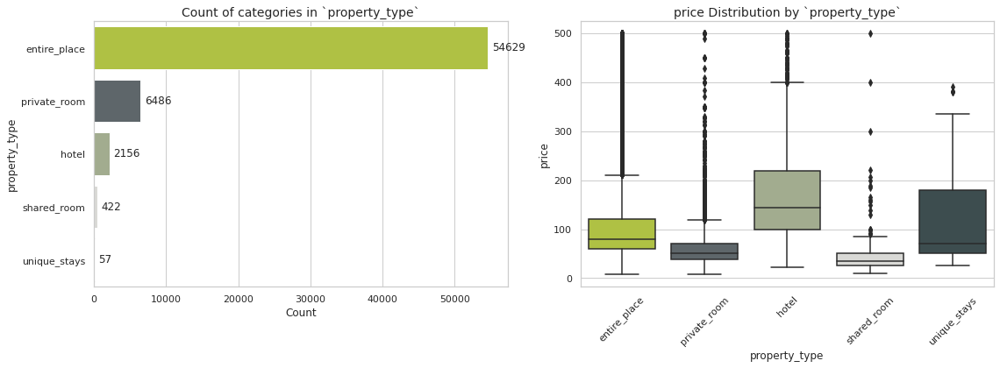

In [0]:
plot_categorical_with_target(df, "property_type", "price")

- In the following visualizations we can see more clearly the distribution of the property types comparing to their price. This transformation into categories helped us group similar listings to have a more clear view on their distribution relating to their price.

In [0]:
unique_property_types = (
    df
    .select("property_type")
    .distinct()
    .rdd
    .flatMap(lambda row: row)
    .collect()
)

print("Unique property_type values:")
for pt in unique_property_types:
    print(f"  - {pt}")

Unique property_type values:
  - entire_place
  - hotel
  - private_room
  - shared_room
  - unique_stays


- We went from 66 different property types to 5. <br>
- In general hotel listings are more expensive, these makes sense due to extra services like housekeeping, breakfast, frontdesk services 24/7, gym, etc etc. <br>
- The majority of the listings (84%) are entire place listings. This indicates there is a strong market for renting entire properties in Paris. <br>
- As expected the least common property type is unique type (0.09%) 


### 9.3 Amenities Length

In [0]:
# 1) Parse the string as a JSON array of strings
df = df.withColumn(
    "amenities_array",
    from_json(col("amenities"), ArrayType(StringType()))
)

# 2) Create "amenities_length" as the size of that array
df = df.withColumn(
    "amenities_length",
    size(col("amenities_array"))
)

# Verify
display(df.select("amenities",'amenities_array' ,"amenities_length").limit(5))

amenities,amenities_array,amenities_length
"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]","List(Heating, Kitchen, Washer, Wifi, Long term stays allowed)",5
"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Wifi"", ""Long term stays allowed""]","List(Shampoo, Heating, Kitchen, Essentials, Washer, Dryer, Wifi, Long term stays allowed)",8
"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]","List(Heating, TV, Kitchen, Washer, Wifi, Long term stays allowed)",6
"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long term stays allowed""]","List(Heating, TV, Kitchen, Wifi, Long term stays allowed)",5
"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Dryer"", ""Bathtub"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]","List(Heating, TV, Kitchen, Essentials, Hair dryer, Washer, Dryer, Bathtub, Wifi, Elevator, Long term stays allowed, Cable TV)",12


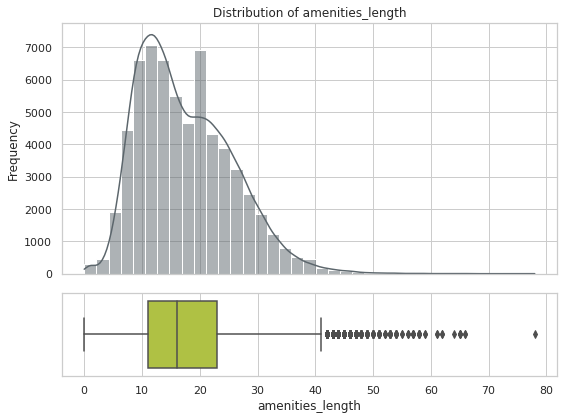

In [0]:
plot_dist_and_box(df, 'amenities_length', bins = 37)

In [0]:
numeric_cols.append('amenities_length')


### 9.4 Amenities Engineering

In [0]:
exploded_df = df.select(explode("amenities_array").alias("amenity"))

unique_amenities = exploded_df.select("amenity").distinct()

amenity_list = [row['amenity'] for row in unique_amenities.collect()]
count = len(amenity_list)
print(f"Total number of amenities: {count}")

Total number of amenities: 618


- There are 618 different amenities.
- Having a quick look we can see that there are different words or group of words to say the same (for example: 'De Dietrich stainless steel oven', 'MIELE oven' that are referring to just oven)

#### Airbnb Amenities Processing Pipeline

1. **Standardize amenities using a controlled keyword list**

   * Replace verbose or branded terms (e.g., `"de dietrich stainless steel oven"`)
   * Keep only simplified, meaningful keywords (e.g., `"oven"`)
   * Filter out non-relevant or redundant tokens

2. **Normalize the `amenities` column**

   * Convert all text to lowercase
   * Remove special characters, punctuation, and extra spaces
   * Ensure consistent formatting across listings

3. **Group standardized keywords into amenity categories**

   * Create a dictionary mapping categories (e.g., `"kitchen"`, `"safety"`, `"baby-friendly"`)
   * Each category contains a curated list of associated amenities

4. **Enrich the DataFrame with category-based feature columns**

   * For each listing, calculate the proportion of amenities it has in each category:
     `(# matched amenities in category) / (total amenities in category)`
   * Add one column per category with these proportions

In [0]:
keywords = ['kettle', 'dedicated workspace table', 'indoor fireplace', 'coffee machine', 'first aid kit', 'stove', 'washerin unit', 'kitchen', 'single level home', 'sound system', 'clothing storage', 'refrigerator', 'garden', 'oven', 'hdtv', 'netflix', 'smoking allowed', 'tv', 'body soap', 'outdoor furniture', 'crib','coffee', 'movie projector', 'babysitter recommendations','host greets you','baby safety gates','pool table', 'air conditioning','parking', 'outlet covers','heating','window guards','waterfront','lake access','bedroom comforts','shampoo','washer','fireplace guards','baby monitor','conditioner','ac unit','extra pillows and blankets','childrens dinnerware','hot water','iron','dryer','childrens books and toys','wifi','game console','barbecue','washer','shower gel','breakfast','baking sheet','cleaning before checkout','patio', 'balcony','pool','self checkin','lockbox','sauna','keypad','hangers','drying rack for clothing','fans','wine glasses','private entrance','dryerin','bathtub','dishes and silverware','microwave','outdoor shower','heater','high chair','safe','beachfront','smoke alarm','pets allowed','fan','ethernet','dining table','dedicated workspace','elevator','laundromat','gym','table corner guards','toaster','cleaning products','hot tub','nespresso machine','ev charger','smart lock','record player','fridge','outdoor dining area','rice maker','essentials','luggage dropoff allowed','carbon monoxide alarm','long term stays allowed','bathroom essentials','dishwasher','freezer','bidet','skiinskiout','building staff','washer in','roomdarkening shades','mosquito net','fire extinguisher','beach essentials','garden or backyard','changing table','cooking basics','piano','bed linens','bbq grill','baby bath','bread maker','childrens books and toys','eletric blinds','rain shower','bikes','wine cellar','gated pproperty','wine cooler','ice machine','board games','suitable for events','decorative fireplace','trash compactor','espresso machine','balcony','dryer in','dual vanity','wet bar','private living room','library','massage bed','office','music system','dvd player','outdoor seating','internet','patio','gated community','video games','sun loungers','spa','ipod dock','game room','steam room','projector','dining area','books','ironing board','lounge area','blender','restaurant','gas grill','smoking parlor','terrace','woodburning fireplace','bluray player','lock on bedroom door','ping pong table','garage','ipad','room service','housekeeping','toiletries','bathrobes','bikes','bed sheets and pillows','selfparking','alarm system','airport shuttle','fitness center','minibar','bar','laundry services','courtyard','concierge','slippers','hammam','bluetooth speaker','printer','turndown service','bottled water','linens','desk','kitchenette','washer','security cameras']

- Next we normalize the amenities to this keywords and insert them in a new columns named "standardized_amenities".

In [0]:
# Step 1: Normalize keywords
normalized_keywords = list(set([
    re.sub(r'[^a-zA-Z\s]', '', kw.lower()).strip()
    for kw in keywords
]))
keyword_set = set(normalized_keywords)

# Step 2: Define the UDF
def map_amenities_to_keywords(amenities):
    if not amenities:
        return []
    
    cleaned = []
    for amenity in amenities:
        normalized = re.sub(r'[^a-zA-Z\s]', '', amenity.lower()).strip()
        for kw in keyword_set:
            if kw in normalized:
                cleaned.append(kw)
                break
    return list(set(cleaned))  # Remove duplicates

map_udf = udf(map_amenities_to_keywords, ArrayType(StringType()))

# Step 3: Parse JSON if needed (only if amenities is a JSON string)
schema = ArrayType(StringType())
df = df.withColumn("amenities_array", from_json(col("amenities"), schema))

# Step 4: Add the cleaned standardized amenities column
df = df.withColumn("standardized_amenities", map_udf(col("amenities_array")))


- Creation of a dictionary of amenity categories and correspondent amenities belonging to those categories.

In [0]:
amenity_categories = {
    "living_entertainment": [
        "tv", "hdtv", "netflix", "sound system", "movie projector", "record player",
        "dvd player", "bluray player", "ipod dock", "music system", "books",
        "board games", "game console", "video games", "ping pong table",
        "game room", "lounge area", "projector"
    ],
    "kitchen_dining": [
        "kitchen", "microwave", "oven", "stove", "toaster", "fridge", "refrigerator",
        "freezer", "rice maker", "bread maker", "nespresso machine", "coffee machine",
        "espresso machine", "kettle", "cooking basics", "dishes and silverware",
        "baking sheet", "blender", "dining table", "dining area", "wine glasses",
        "wine cooler", "wine cellar", "gas grill", "bbq grill", "barbecue", "dishwasher",
        "kitchenette", "ice machine"
    ],
    "bedroom": [
        "bed linens", "bedroom comforts", "bed sheets and pillows", "clothing storage",
        "extra pillows and blankets", "hangers", "ironing board", "iron",
        "roomdarkening shades", "linens", "alarm system"
    ],
    "bathroom": [
        "body soap", "shampoo", "conditioner", "shower gel", "bathtub", "bidet",
        "hot water", "bathroom essentials", "toiletries", "dual vanity", "rain shower",
        "bathrobes"
    ],
    "baby_family": [
        "crib", "high chair", "baby bath", "baby monitor", "baby safety gates",
        "childrens books and toys", "childrens dinnerware", "changing table",
        "table corner guards"
    ],
    "laundry_cleaning": [
        "washer", "washerin unit", "washer in", "dryer", "dryerin",
        "drying rack for clothing", "laundromat", "cleaning products",
        "cleaning before checkout", "laundry services"
    ],
    "safety_security": [
        "smoke alarm", "carbon monoxide alarm", "fire extinguisher",
        "fireplace guards", "outlet covers", "window guards", "mosquito net",
        "security cameras", "smart lock", "lockbox", "keypad",
        "lock on bedroom door", "alarm system"
    ],
    "outdoor_garden": [
        "patio", "balcony", "terrace", "garden", "garden or backyard",
        "outdoor furniture", "outdoor dining area", "outdoor seating",
        "outdoor shower", "sun loungers", "beachfront", "lake access",
        "beach essentials", "bikes", "gated community", "gated pproperty", "hammock"
    ],
    "heating_cooling": [
        "air conditioning", "ac unit", "fan", "fans", "heater", "heating",
        "indoor fireplace", "woodburning fireplace", "decorative fireplace"
    ],
    "travel_access": [
        "self checkin", "luggage dropoff allowed", "long term stays allowed",
        "private entrance", "suitable for events", "garage", "parking",
        "selfparking", "airport shuttle"
    ],
    "wellness_leisure": [
        "pool", "sauna", "hot tub", "hammam", "massage bed", "spa", "steam room"
    ],
    "workspace_tech": [
        "dedicated workspace", "dedicated workspace table", "desk", "office",
        "ethernet", "printer", "ipad", "internet", "wifi"
    ],
    "guest_services": [
        "host greets you", "room service", "housekeeping", "turndown service",
        "concierge", "minibar", "bar", "restaurant", "bottled water", "slippers",
        "building staff", "books", "library", "courtyard"
    ],
    "misc_essentials": [
        "essentials", "first aid kit", "pets allowed", "outlet covers"
    ]
}

- Enrich the DataFrame with category-based feature columns.

In [0]:
# Existing category dictionary
amenity_categories_broadcast = sc.broadcast(amenity_categories)

for category, keywords in amenity_categories.items():
    category_col = f"{category}"
    df = df.withColumn(
        category_col,
        size(array_intersect(col("standardized_amenities"), 
                             array([lit(k) for k in keywords])))
        )


In [0]:
display(df.limit(5))

host_id,listing_id,name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,host_days_active,host_years_active,amenities_array,amenities_length,standardized_amenities,living_entertainment,kitchen_dining,bedroom,bathroom,baby_family,laundry_cleaning,safety_security,outdoor_garden,heating_cooling,travel_access,wellness_leisure,workspace_tech,guest_services,misc_essentials
1466919,281420,"Beautiful Flat in le Village Montmartre, Paris",2011-12-03,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Buttes-Montmartre,null,Paris,48.88668,2.33343,entire_place,Entire place,2,1,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",53,2,1125,100,10,10,10,10,10,10,0,3354,9,"List(Heating, Kitchen, Washer, Wifi, Long term stays allowed)",5,"List(washer, wifi, heating, long term stays allowed, kitchen)",0,1,0,0,0,1,0,0,1,1,0,1,0,0
10328771,3705183,39 mÂ² Paris (Sacre CÅ“ur),2013-11-29,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Buttes-Montmartre,null,Paris,48.88617,2.34515,entire_place,Entire place,2,1,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Wifi"", ""Long term stays allowed""]",120,2,1125,100,10,10,10,10,10,10,0,2627,7,"List(Shampoo, Heating, Kitchen, Essentials, Washer, Dryer, Wifi, Long term stays allowed)",8,"List(washer, wifi, heating, shampoo, essentials, long term stays allowed, dryer, kitchen)",0,1,0,1,0,2,0,0,1,1,0,1,0,1
19252768,4082273,"Lovely apartment with Terrace, 60m2",2014-07-31,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Elysee,null,Paris,48.88112,2.31712,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",89,2,1125,100,10,10,10,10,10,10,0,2383,6,"List(Heating, TV, Kitchen, Washer, Wifi, Long term stays allowed)",6,"List(washer, wifi, heating, tv, long term stays allowed, kitchen)",1,1,0,0,0,1,0,0,1,1,0,1,0,0
10668311,4797344,Cosy studio (close to Eiffel tower),2013-12-17,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Vaugirard,null,Paris,48.84571,2.30584,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long term stays allowed""]",58,2,1125,100,10,10,10,10,10,10,0,2609,7,"List(Heating, TV, Kitchen, Wifi, Long term stays allowed)",5,"List(wifi, heating, tv, long term stays allowed, kitchen)",1,1,0,0,0,0,0,0,1,1,0,1,0,0
24837558,4823489,Close to Eiffel Tower - Beautiful flat : 2 rooms,2014-12-14,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Passy,null,Paris,48.855,2.26979,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Dryer"", ""Bathtub"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]",60,2,1125,100,10,10,10,10,10,10,0,2247,6,"List(Heating, TV, Kitchen, Essentials, Hair dryer, Washer, Dryer, Bathtub, Wifi, Elevator, Long term stays allowed, Cable TV)",12,"List(washer, wifi, elevator, heating, essentials, tv, long term stays allowed, dryer, bathtub, kitchen)",1,1,0,1,0,2,0,0,1,1,0,1,0,1



__`INFO:`__ Dropping raw features

In [0]:
cols_to_drop.extend(['amenities', 'amenities_array', 'standardized_amenities'])

In [0]:
numeric_cols.extend([
    "living_entertainment",
    "kitchen_dining",
    "bedroom",
    "bathroom",
    "baby_family",
    "laundry_cleaning",
    "safety_security",
    "outdoor_garden",
    "heating_cooling",
    "travel_access",
    "wellness_leisure",
    "guest_services",
    "misc_essentials"
])

numeric_cols = [c for c in numeric_cols if c not in cols_to_drop]
categorical_cols = [c for c in categorical_cols if c not in cols_to_drop]
binary_cols = [c for c in binary_cols if c not in cols_to_drop]


# DROPING COLUMNS 

In [0]:
df_cleaned = (
    df
    .drop(*cols_to_drop)    
)



__`INFO:`__:  Saving cleaned df into a .csv




In [0]:
(
    df_cleaned
    .coalesce(1)                   # squeeze to 1 partition
    .write
    .option("header", "true")
    .mode("overwrite")
    .csv("dbfs:/FileStore/tables/Listings_cleaned")
)




__`INFO:`__: Sanity checking if it was saved




In [0]:
df_check = (
    spark.read
         .option("header", "true")
         .csv("dbfs:/FileStore/tables/Listings_cleaned")
)
display(df_check.limit(5))
df_shape(df)

host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,property_type,room_type,accommodates,bedrooms,price,minimum_nights,review_scores_rating,instant_bookable,host_days_active,host_years_active,amenities_length,living_entertainment,kitchen_dining,bedroom,bathroom,baby_family,laundry_cleaning,safety_security,outdoor_garden,heating_cooling,travel_access,wellness_leisure,workspace_tech,guest_services,misc_essentials
0,1,1,0,Buttes-Montmartre,entire_place,Entire place,2,1,53,2,100,0,3354,9,5,0,1,0,0,0,1,0,0,1,1,0,1,0,0
0,1,1,1,Buttes-Montmartre,entire_place,Entire place,2,1,120,2,100,0,2627,7,8,0,1,0,1,0,2,0,0,1,1,0,1,0,1
0,1,1,0,Elysee,entire_place,Entire place,2,1,89,2,100,0,2383,6,6,1,1,0,0,0,1,0,0,1,1,0,1,0,0
0,1,1,1,Vaugirard,entire_place,Entire place,2,1,58,2,100,0,2609,7,5,1,1,0,0,0,0,0,0,1,1,0,1,0,0
0,1,1,0,Passy,entire_place,Entire place,2,1,60,2,100,0,2247,6,12,1,1,0,1,0,2,0,0,1,1,0,1,0,1


63750 rows × 52 columns


### Bi-variate Analysis and Multi-variate Analysis (WIP)

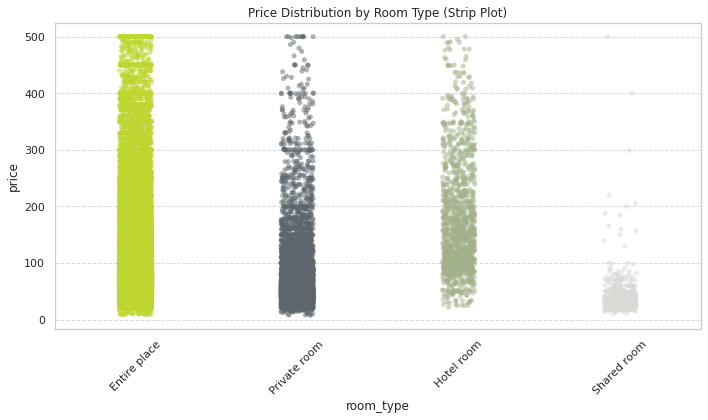

In [0]:
# Convert Spark DataFrame to Pandas
data = df.select("room_type", "price").dropna().toPandas()

# Plot
plt.figure(figsize=(10, 6))
sns.stripplot(data=data, x="room_type", y="price", alpha=0.5, jitter=True, palette=main_palette)
plt.title("Price Distribution by Room Type (Strip Plot)")
plt.xticks(rotation=45)
plt.grid(True, axis='y', linestyle='--', alpha=0.7)

# Set y-axis ticks every 1000
#plt.yticks(np.arange(0, data["price"].max() + 1000, 1000))

plt.tight_layout()
plt.show()

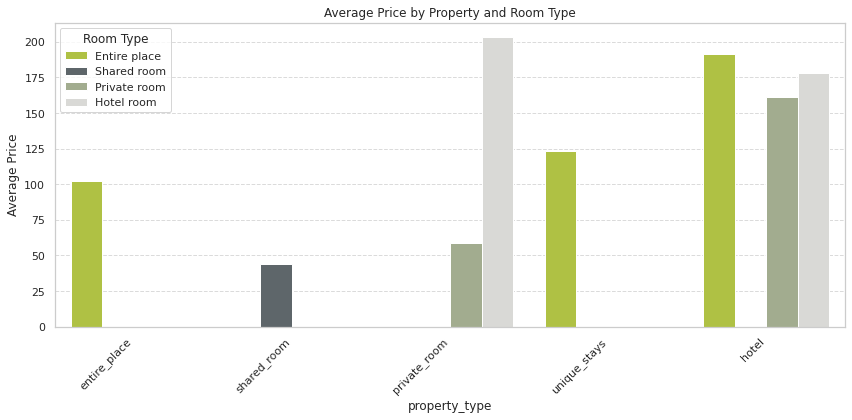

In [0]:
# Group in Spark and calculate average price
grouped_spark = df.groupBy("property_type", "room_type").agg(F.mean("price").alias("price"))

# Convert result to Pandas
grouped = grouped_spark.toPandas()

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(data=grouped, x="property_type", y="price", hue="room_type", palette=main_palette)
plt.title("Average Price by Property and Room Type")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Average Price")
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.legend(title="Room Type")
plt.tight_layout()
plt.show()

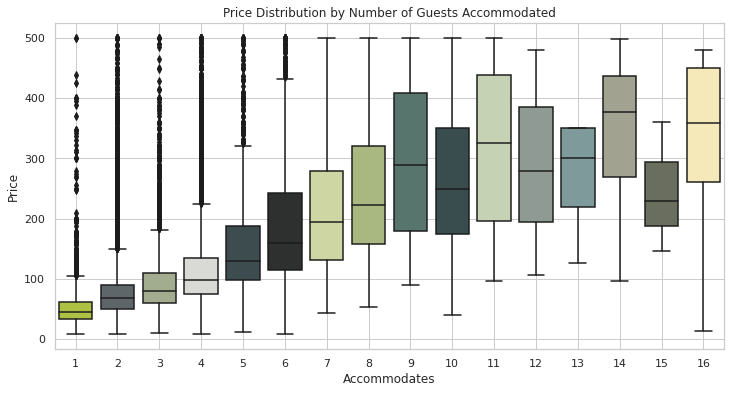

In [0]:
data = df.select("accommodates", "price").dropna().toPandas()

plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x="accommodates", y="price", palette=main_palette)
plt.title("Price Distribution by Number of Guests Accommodated")
plt.xlabel("Accommodates")
plt.ylabel("Price")
plt.grid(True)
plt.show()

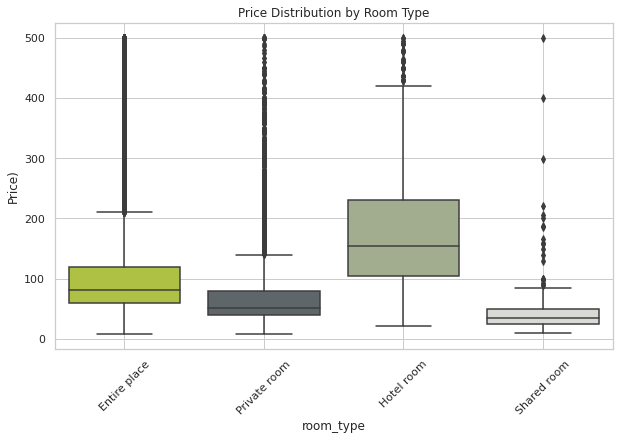

In [0]:
data = df.dropna(subset=["room_type", "price"]).toPandas()

plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x="room_type", y="price", palette=main_palette)
plt.title("Price Distribution by Room Type")
plt.xticks(rotation=45)
plt.grid(True)
plt.ylabel("Price)")
plt.show()

In [0]:
#numeric_cols = list(set(numeric_cols))

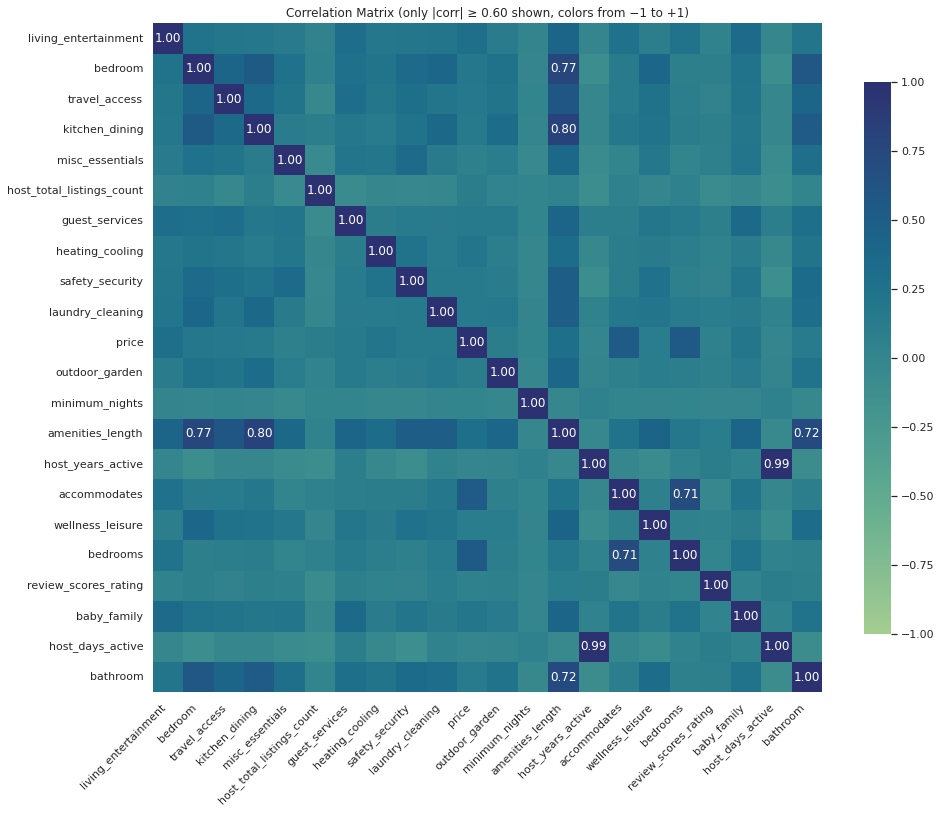

In [0]:
# 1. Drop rows with nulls in numeric columns
df_numeric = df.select(numeric_cols).dropna()

# 2. Assemble features into a vector column
assembler = VectorAssembler(inputCols=numeric_cols, outputCol="features")
df_vector = assembler.transform(df_numeric).select("features")

# 3. Compute Pearson correlation matrix
corr_matrix = Correlation.corr(df_vector, "features", "pearson").head()[0]

# 4. Convert to NumPy array → Pandas DataFrame
corr_array = corr_matrix.toArray()
corr_df = pd.DataFrame(corr_array, index=numeric_cols, columns=numeric_cols)

# 5. Build an "annot" DataFrame: show only |corr| ≥ 0.60, else blank
annot_df = corr_df.copy().applymap(lambda x: f"{x:.2f}" if abs(x) >= 0.60 else "")

# 6. Plot heatmap with fixed vmin/vmax
plt.figure(figsize=(14, 12))
sns.heatmap(
    corr_df,
    annot=annot_df,
    cmap="crest",
    fmt="",            # annotation is already a string-DataFrame
    vmin=-1,           # force color scale minimum at -1
    vmax=1,            # force color scale maximum at +1
    square=True,
    cbar_kws={"shrink": 0.75}
)
plt.title("Correlation Matrix (only |corr| ≥ 0.60 shown, colors from −1 to +1)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


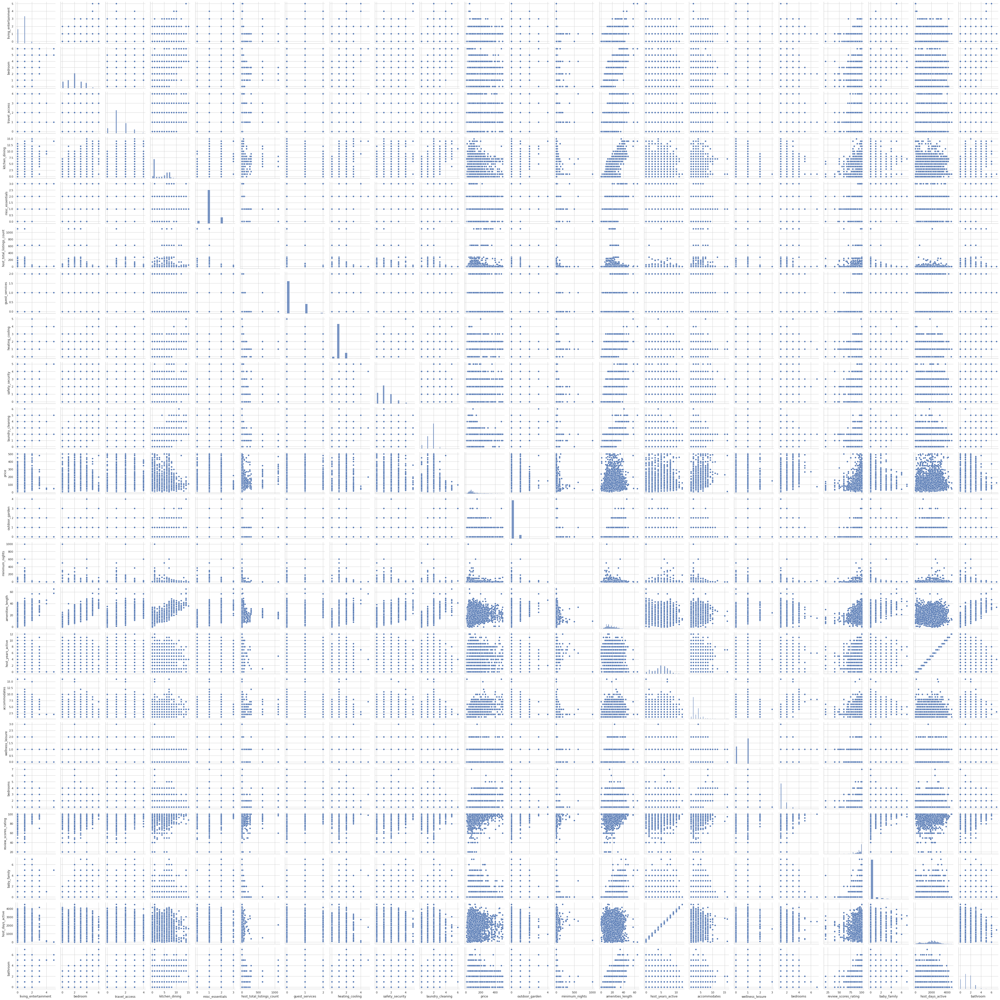

In [0]:
sns.pairplot(df.sample(fraction=0.1, seed=42).toPandas()[numeric_cols])
plt.tight_layout()
plt.show()